# Test uniformity of HoloAmpAg grating with HD185975 scanning
==================================================================================================

- author : Jérémy Neveu
- date   : May 31st 2017


In [1]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

ScanHoloAmpAg_HD185975
ccdproc version 1.2.0
bottleneck version 1.2.0
/Users/jneveu/Documents/LSST/Calibration/CTIOAnaJun2017/ana_31may17/ScanHoloAmpAg


### Input directory

In [3]:
inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_31may17/"
MIN_IMGNUMBER=116
MAX_IMGNUMBER=140
date = "20170531"
tag = "trim"
holo_name = "HoloAmAg"
object_name='HD185975'
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=5

### Output directories

In [4]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## Location of the spectra
----------------------------------

In [5]:
dirlist_all = [inputdir]
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt, all_filt1, all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


### Show images

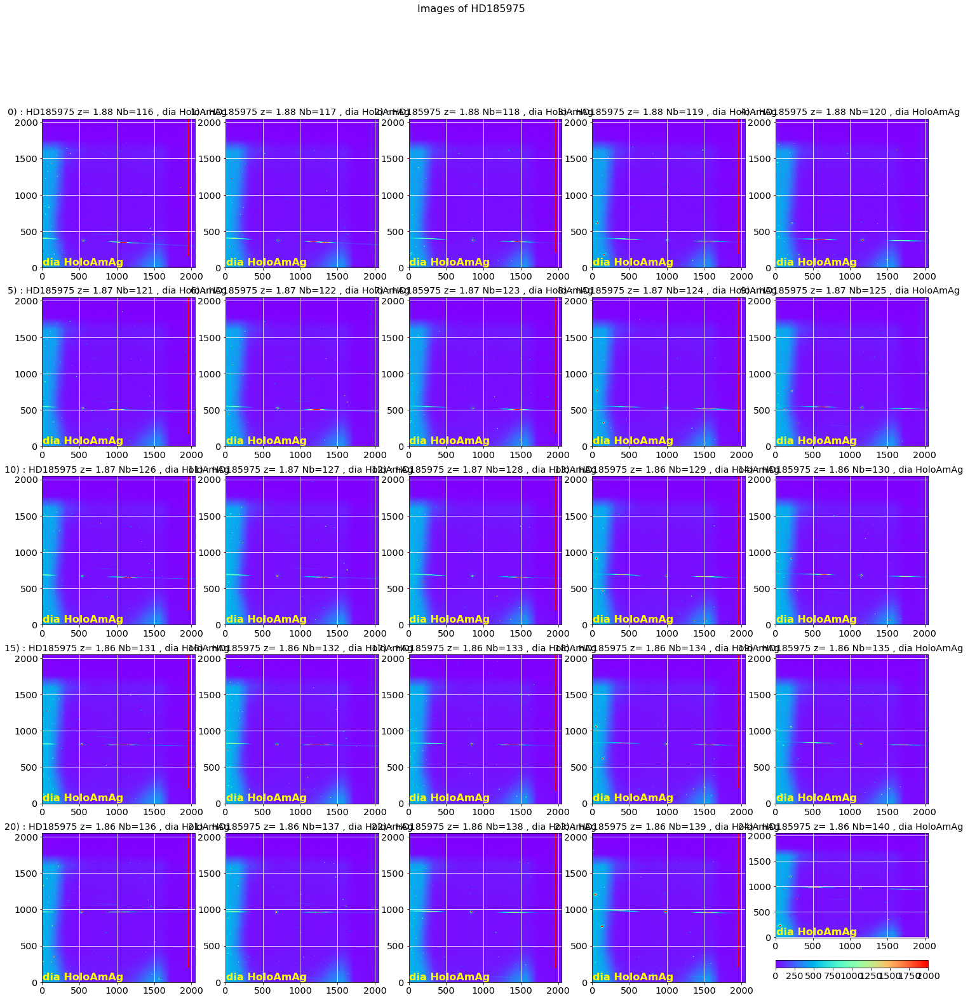

In [6]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000,downsampling=1,verbose=False)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

### Show histograms

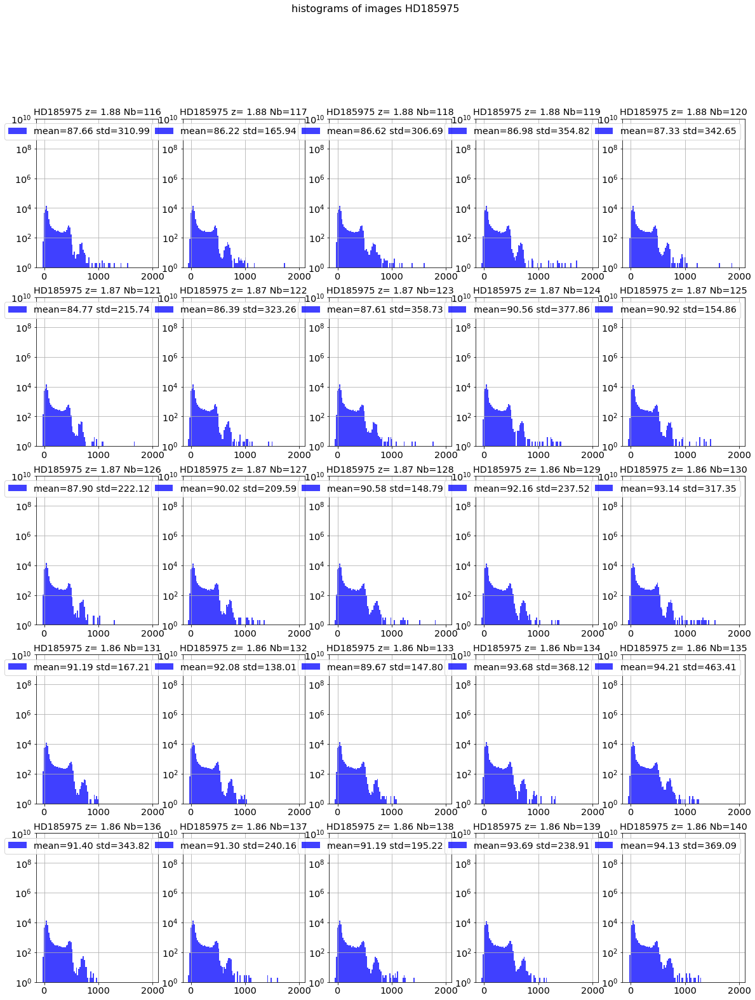

In [7]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=5,bins=100,range=(-50,2000),downsampling=10,verbose=False)

### Cut the images

To extract the spectra to analyze

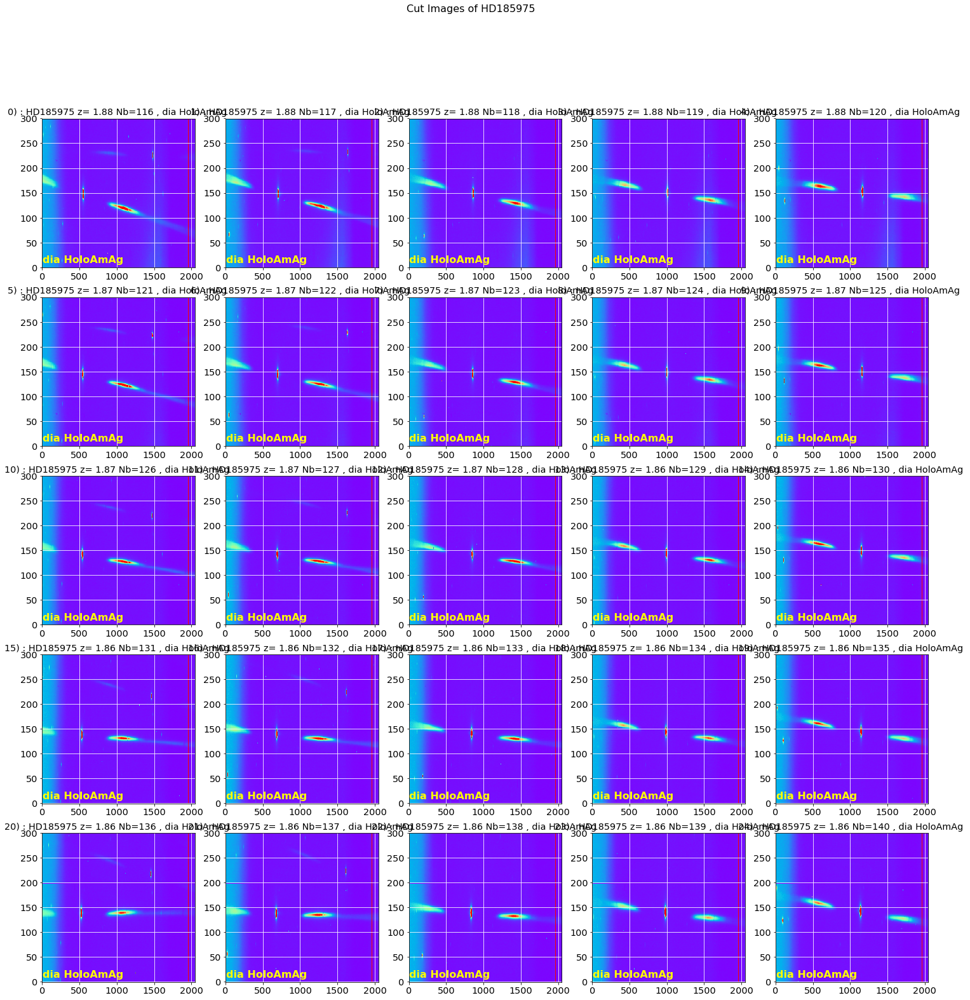

In [8]:
x_guess = [510,  700, 900, 1000, 1100]*5
y_guess = [[375]*5, [525]*5, [675]*5, [825]*5, [975]*5]
y_guess = [val for sublist in y_guess for val in sublist]
DeltaY=[150]*len(all_images)
DeltaX=[2000]*len(all_images)  # must be very large to be able to compute incident angle

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,
                            NBIMGPERROW=5,vmin=0,vmax=2000)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

### Save cut images

In [9]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    print short_infilename
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)

trim_20170531_116.fits
trim_20170531_117.fits
trim_20170531_118.fits
trim_20170531_119.fits
trim_20170531_120.fits
trim_20170531_121.fits
trim_20170531_122.fits
trim_20170531_123.fits
trim_20170531_124.fits
trim_20170531_125.fits
trim_20170531_126.fits
trim_20170531_127.fits
trim_20170531_128.fits
trim_20170531_129.fits
trim_20170531_130.fits
trim_20170531_131.fits
trim_20170531_132.fits
trim_20170531_133.fits
trim_20170531_134.fits
trim_20170531_135.fits
trim_20170531_136.fits
trim_20170531_137.fits
trim_20170531_138.fits
trim_20170531_139.fits
trim_20170531_140.fits


In [10]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_116.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_117.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_118.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_119.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_120.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_121.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_122.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_123.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_124.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_125.fits
-rw-r--r--  1 jneveu  staff  4927680  8 jan 18:55 cut_fitsimages/cutimg_20170531_126.fits
-rw-r--r--

# Find the optimal rotation of the spectra
============================

In [11]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

In [12]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

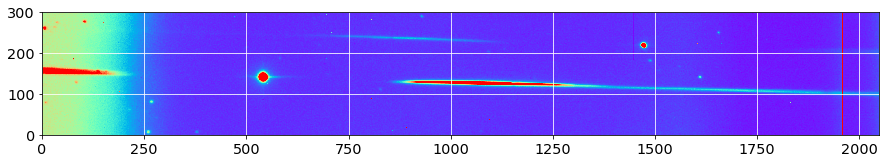

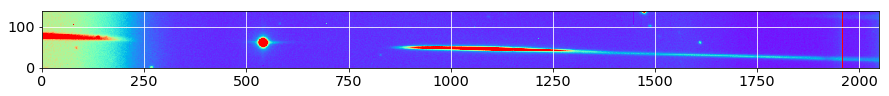

In [13]:
sel=10
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 70
right_edge = IMSIZE

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

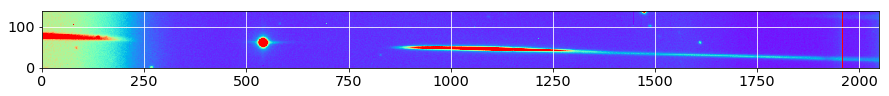

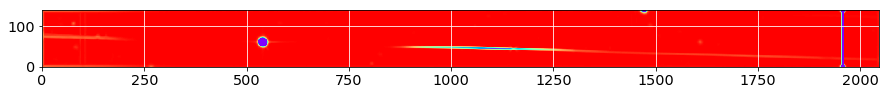

In [14]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

margin_cut = 1

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 3889


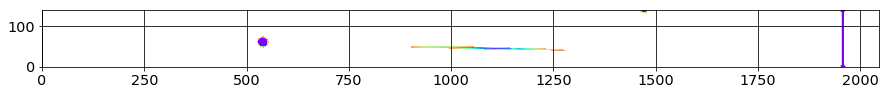

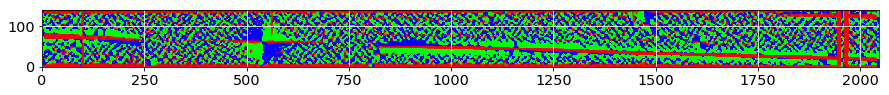

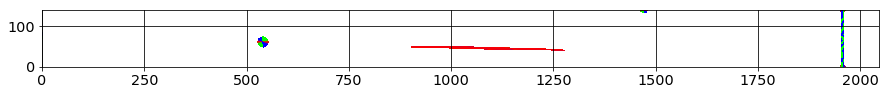

In [15]:
lambda_threshold = -20

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 2219


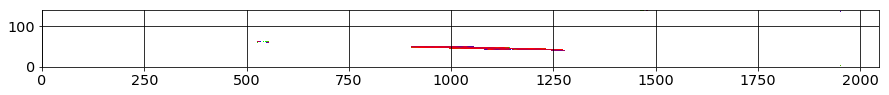

In [16]:
deg_threshold = 8

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : -1.2476123379


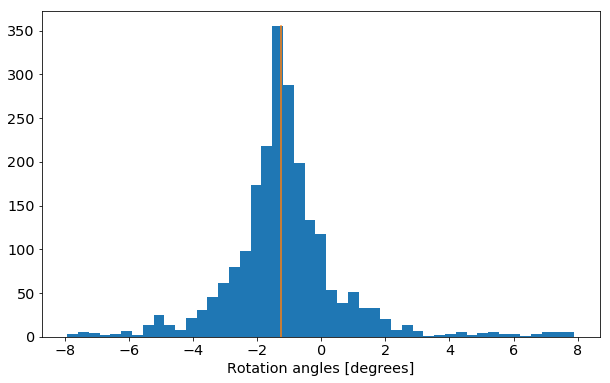

In [17]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

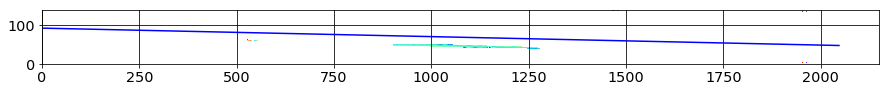

In [18]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()

On peut aussi essayer de fitter le spectre qui a été détecté par la méthode ci-dessus.

Rotation angle from fit : 0.371728651749


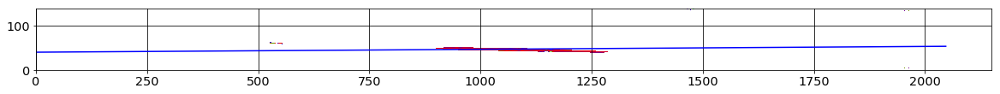

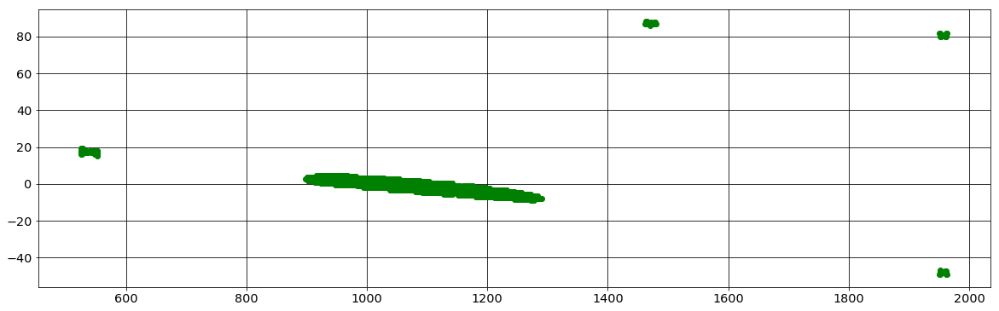

In [19]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

For continuum spectra it is better to use analytic angles.

0  theta =  -2.7864882781
1  theta =  -2.35556190601
2  theta =  -2.02046454141
3  theta =  -1.53718042449
4  theta =  -1.10272201724
5  theta =  -2.05773408373
6  theta =  -1.77962930655
7  theta =  -1.67186371603
8  theta =  -1.49309590908
9  theta =  -1.29036364459
10  theta =  -1.2476123379
11  theta =  -1.24311039973
12  theta =  -1.4564270374
13  theta =  -1.43852672028
14  theta =  -1.43129529704
15  theta =  -0.405933581249
16  theta =  -0.624306367438
17  theta =  -1.17163810111
18  theta =  -1.29781280736
19  theta =  -1.49173362342
20  theta =  0.476724627407
21  theta =  0.11537551106
22  theta =  -0.729285964216
23  theta =  -1.16674237852
24  theta =  -1.57393609383


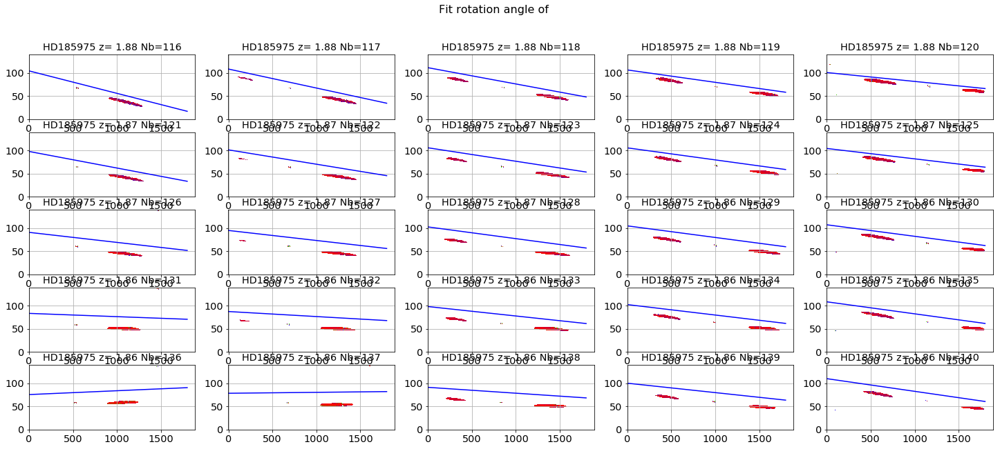

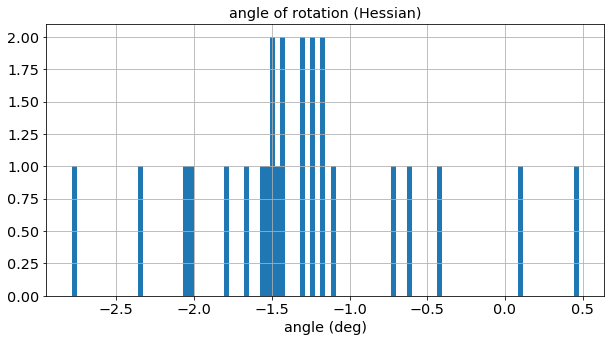

In [20]:
all_theta=ComputeRotationAngleHessian(all_images,x_guess,DeltaY,all_titles,object_name, 
   NBIMGPERROW=5, lambda_threshold = -20, deg_threshold = 8, width_cut = 70, right_edge = 1800, margin_cut=1)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

### Turn the images accordingly

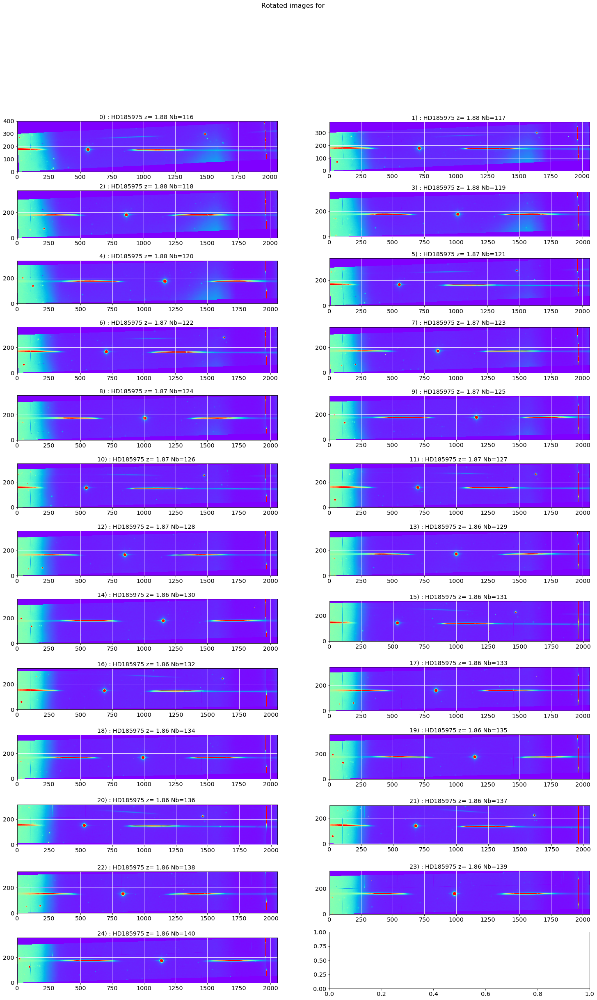

In [21]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,NBIMGPERROW=2,
                            oversample_factor=1) 
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

### Check rotation

In case of bad rotation, check by eye

array([-0.10862229, -0.07621972,  0.03393604, -0.00071685,  0.0429702 ,
       -0.07242709, -0.16421727, -0.05391742,  0.00768146,  0.04923858,
       -0.12043314, -0.17942464,  0.02117948,  0.03150462,  0.05260881,
       -0.14132754, -0.24936819,  0.0694634 , -0.00163016,  0.01309613,
        0.5070061 ,  0.16494486, -0.01093162,  0.01522861,  0.0154545 ])

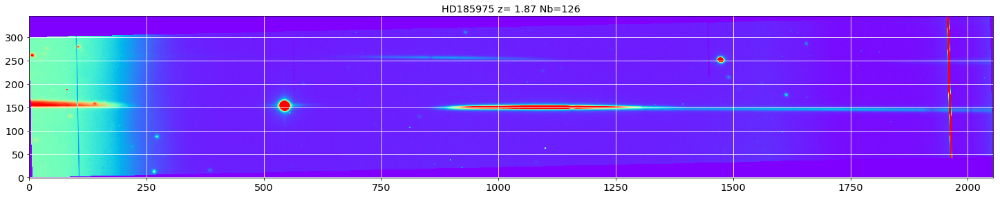

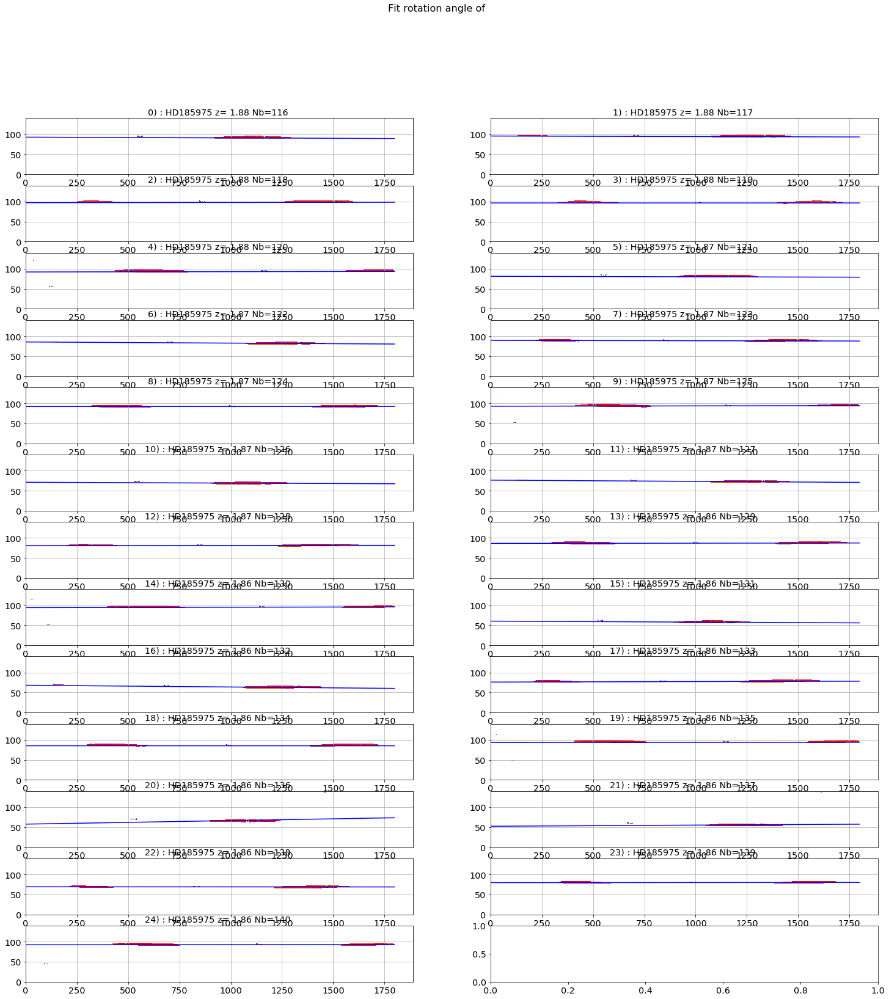

In [22]:
sel=10
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessianAndFit(turned_images,x_guess,DeltaY,all_titles,object_name, 
            NBIMGPERROW=2, lambda_threshold = -20, deg_threshold = 8, width_cut = 70, right_edge = 1800)

Cut the extra spectra that pollute the images.

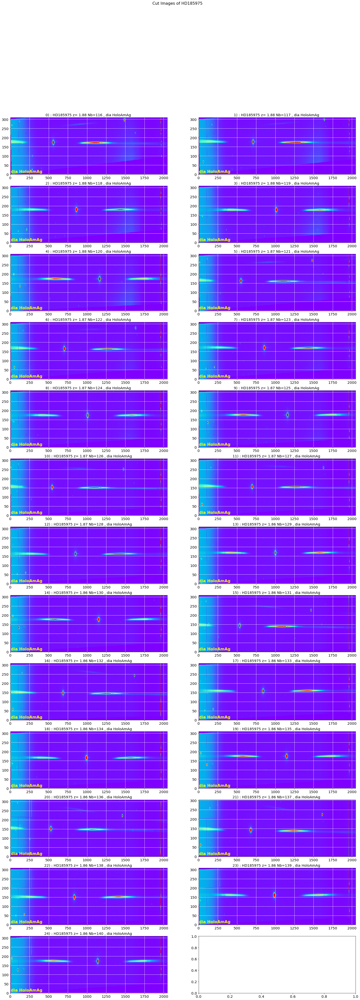

In [23]:
DeltaY_rot2 = [200]*len(all_images)
y_guess_rot2 = [110]*len(all_images)
images_cut_rot=ShowCenterImages(x_guess,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=2000) 

# Find the central star locations
======================================

### Central star positions after rotation

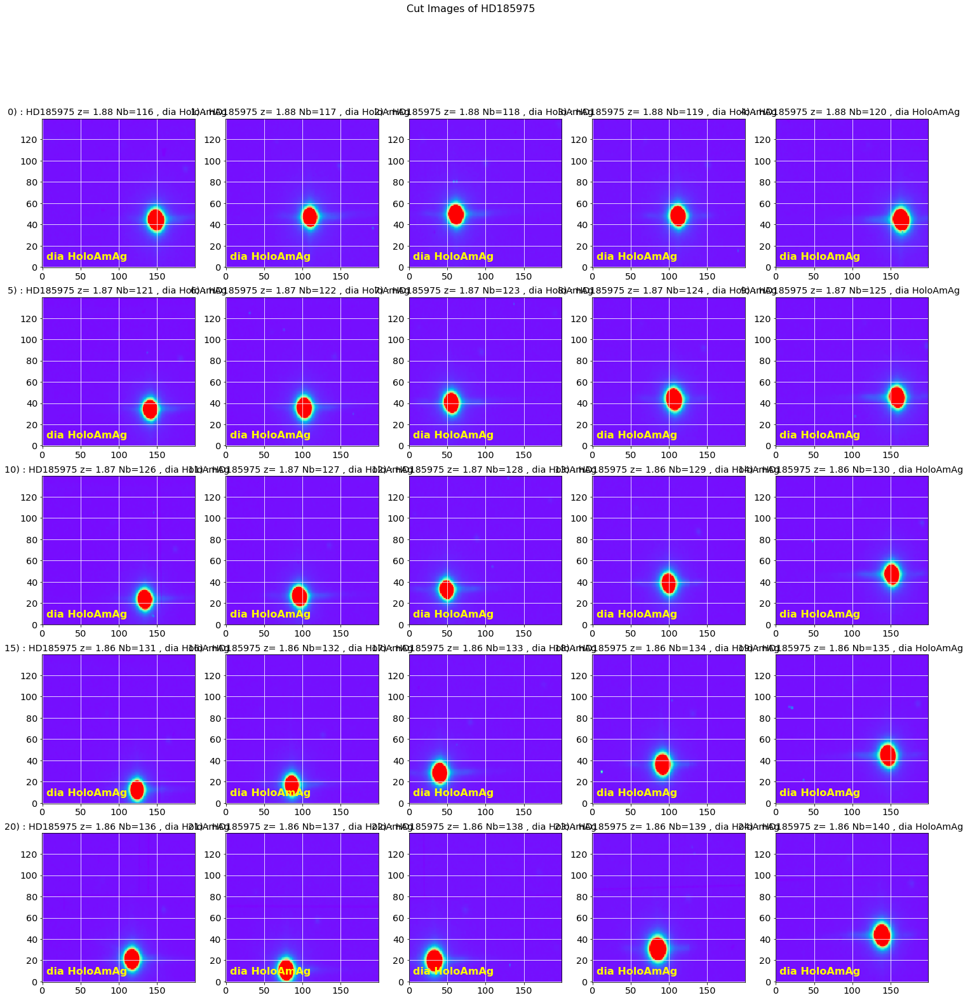

In [24]:
x_guess_rot = x_guess
y_guess_rot = DeltaY_rot2
DeltaY_rot = [70]*len(all_images)
DeltaX_rot = [100]*len(all_images)

images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

/Library/Python/2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


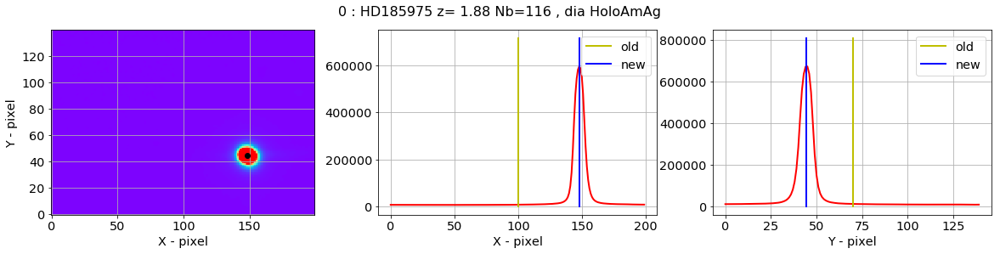

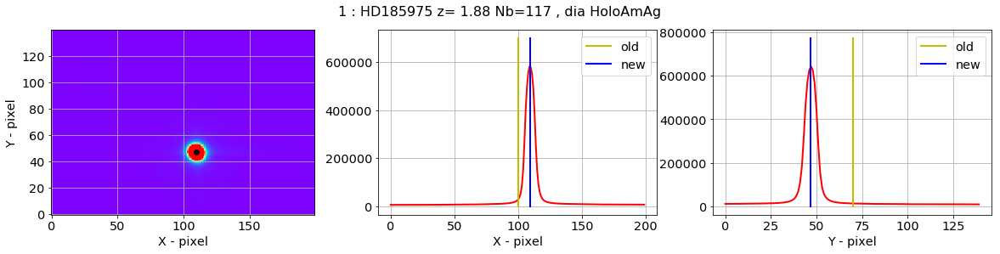

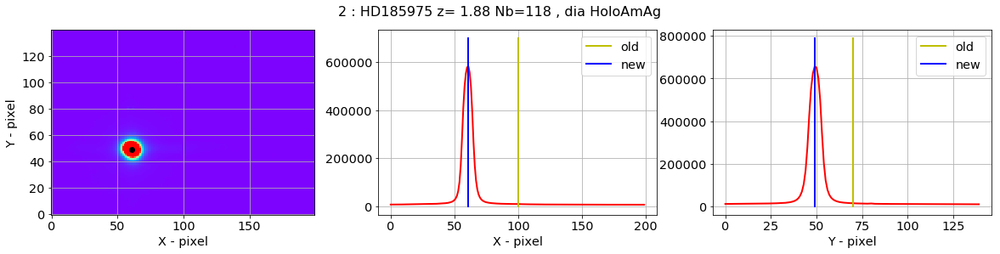

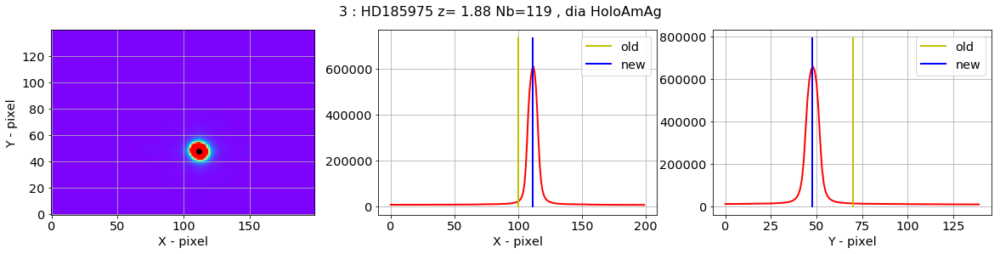

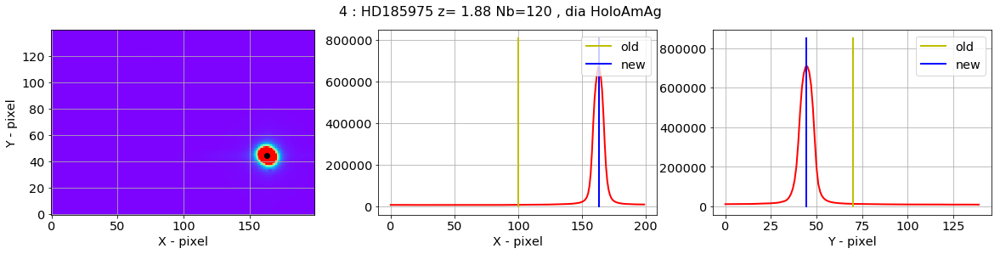

...

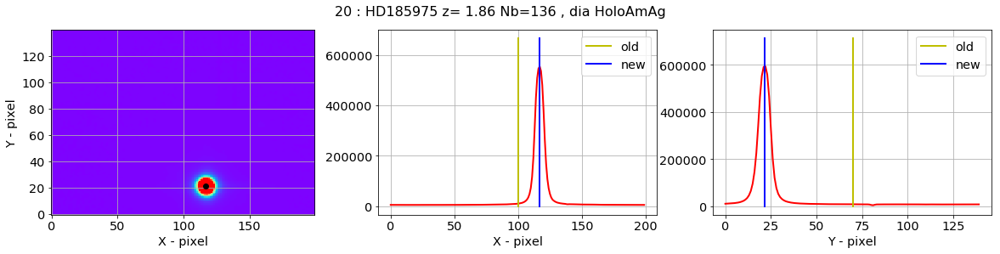

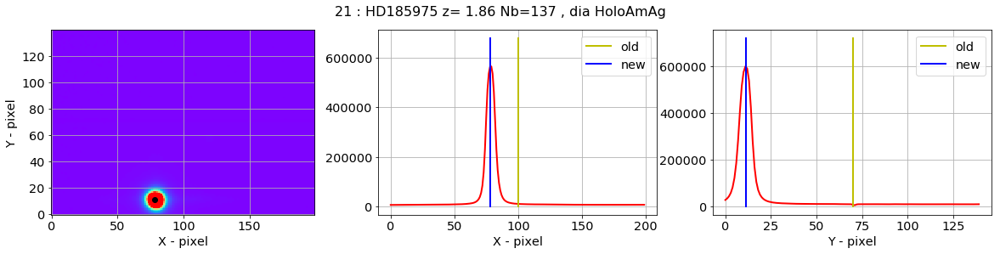

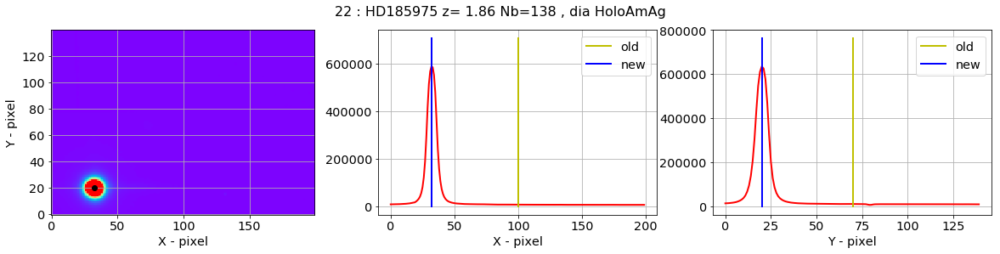

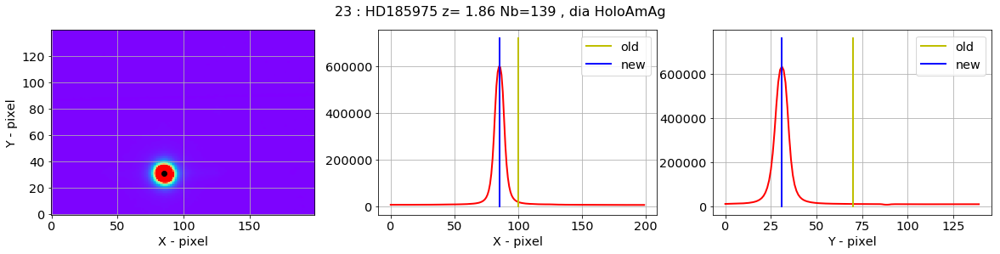

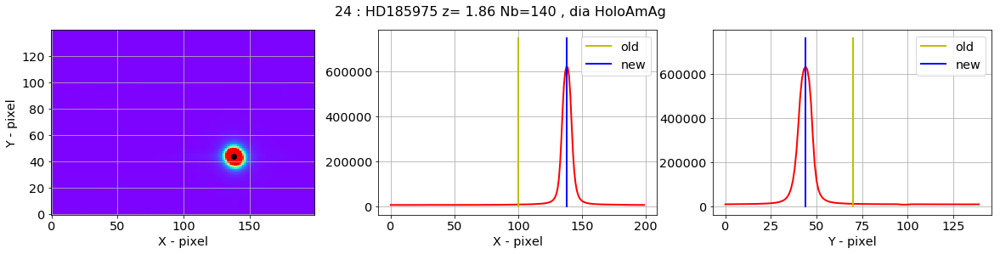

In [25]:
# (JN) valeurs optimisées pour cette étude
#img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=10,threshold=200,sigma=10.0,iters=5)
x, y = check_central_star(images_cut,DeltaX_rot,DeltaY_rot,all_titles,all_filt,Dx=100,Dy=70)

### Central star position

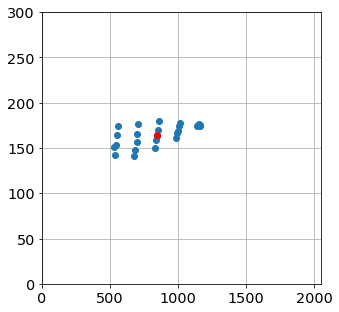

In [26]:
x_star = []
y_star = []
for index in range(len(images_cut)):
    x_star.append(x[index]+x_guess_rot[index]-DeltaX_rot[index])
    y_star.append(y[index]+y_guess_rot[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_star)
y_mean = np.mean(y_star)
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

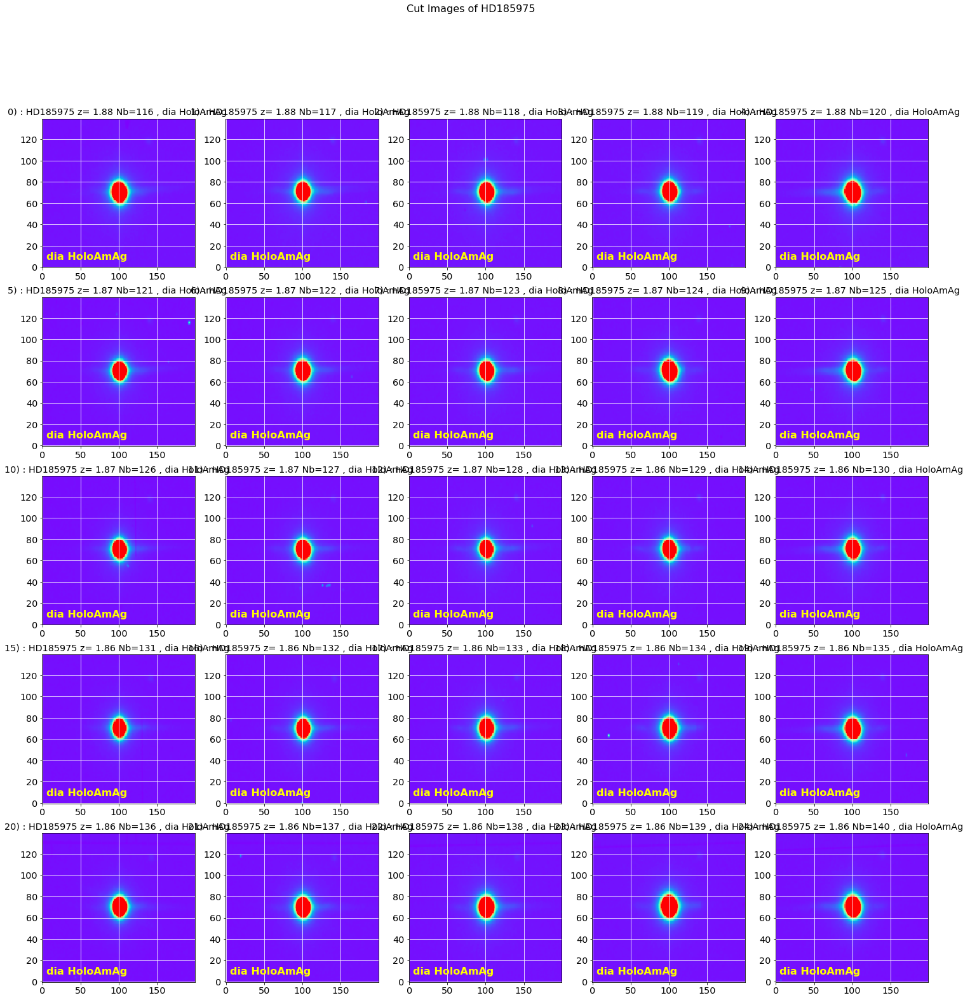

In [27]:
images_cut=ShowCenterImages(x_star,y_star,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

## Pointing positions before rotations

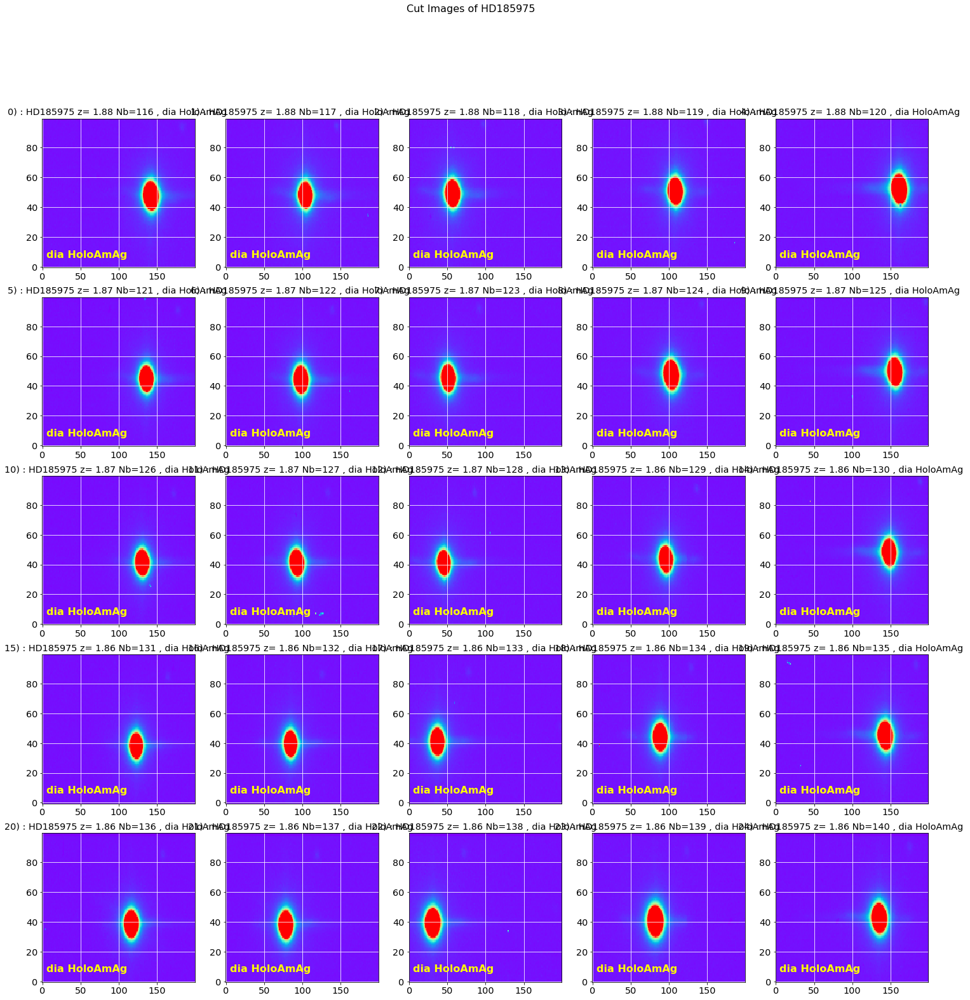

In [28]:
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)
images_raw_cut=ShowCenterImages(x_guess,DeltaY,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

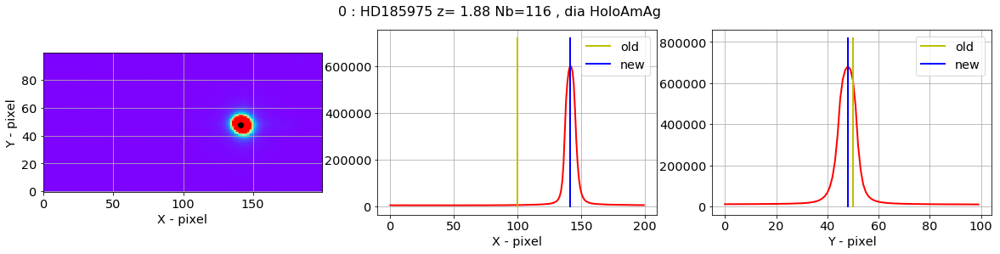

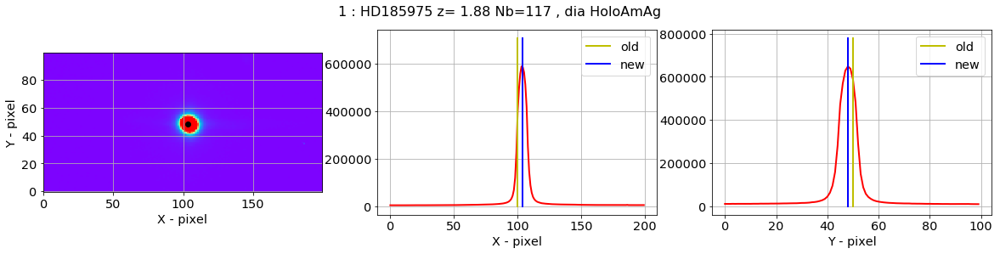

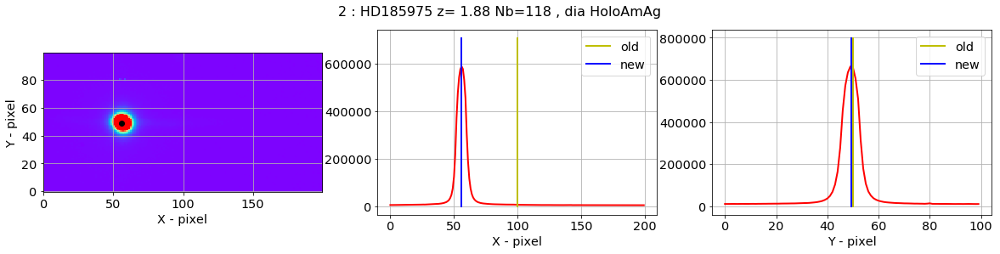

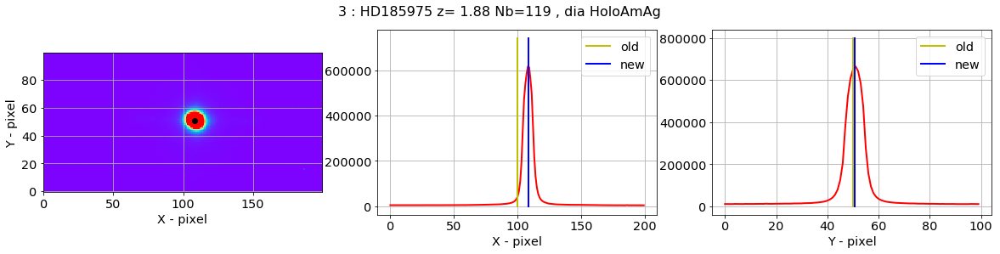

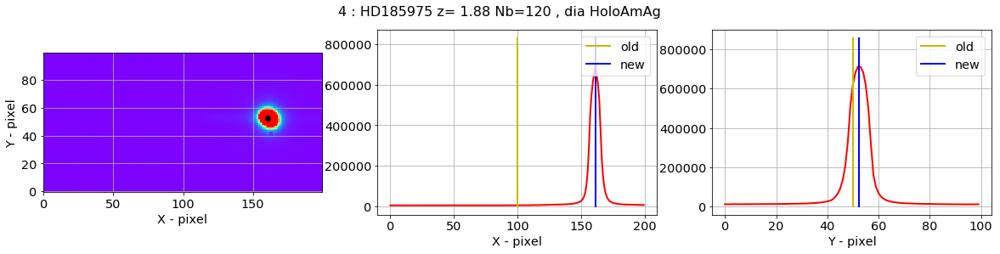

...

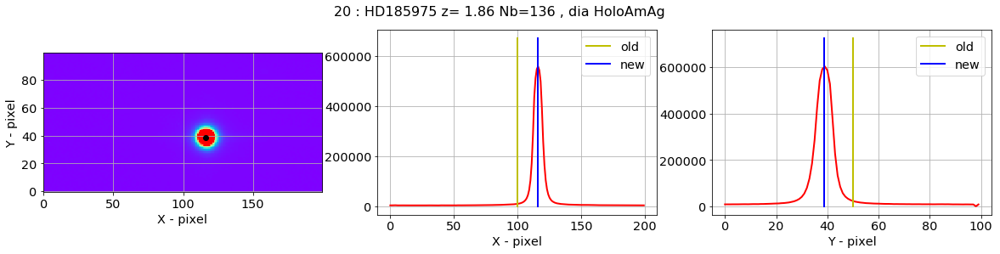

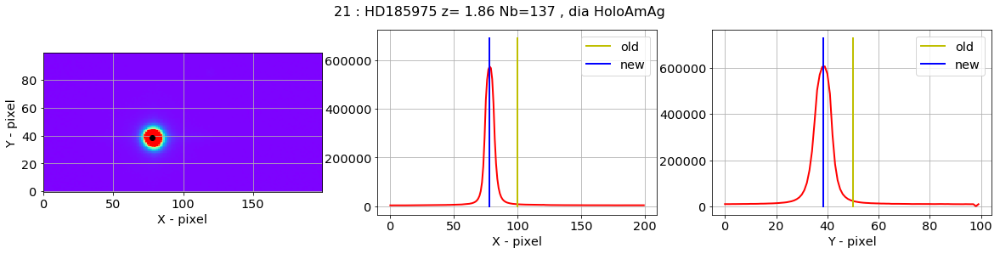

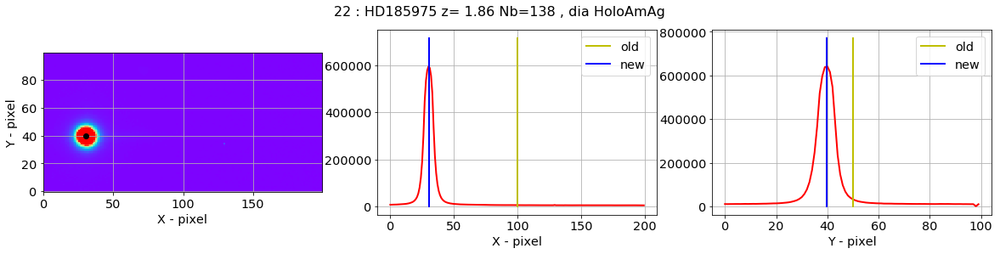

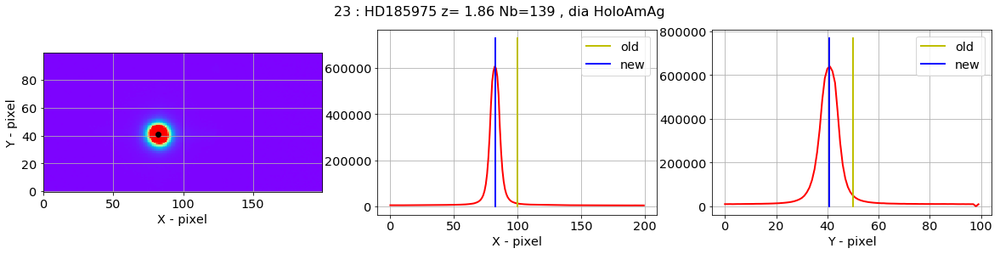

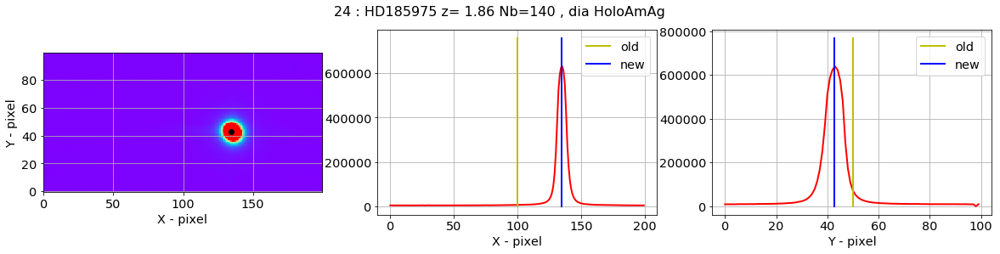

In [29]:
# (JN) valeurs optimisées pour cette étude
#img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=10,threshold=200,sigma=10.0,iters=5)
x, y = check_central_star(images_raw,x_guess,DeltaY,all_titles,all_filt,Dx=100,Dy=50)

[[  551.39406103   472.90975844]
 [  703.58675635   473.06508736]
 [  855.8664964    474.18506799]
 [ 1008.14466385   475.80959549]
 [ 1160.81330284   477.44842488]
 [  545.73178836   619.70193978]
 [  697.7271285    619.24378867]
 [  850.38501405   620.35992182]
 [ 1002.55173282   622.78850033]
 [ 1154.99229005   624.54579557]
 [  539.99968785   766.38036065]
 [  691.99260426   766.56522653]
 [  844.53087754   766.18266119]
 [  995.74279263   768.68900796]
 [ 1147.91894523   773.10592819]
 [  532.49925499   913.6322459 ]
 [  684.27526903   914.93497553]
 [  836.26677797   916.36448233]
 [  988.474906     919.27295272]
 [ 1142.5146501    920.53153191]
 [  525.86481706  1063.86690227]
 [  677.98308756  1063.40885879]
 [  830.1481832   1064.60312097]
 [  982.1654835   1065.80387478]
 [ 1134.63751539  1067.85307389]]
[558.03855095206427, 709.42270389166561, 860.4819437947715, 1011.6119763329229, 1163.2231494948896, 550.71888411440148, 702.0537009050646, 854.58154173140849, 1006.1051329409

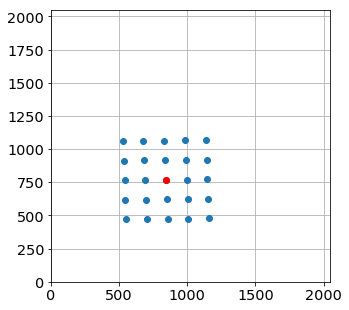

In [30]:
x_pointing = []
y_pointing = []
for index in range(len(images_raw)):
    #x_pointing.append(x[index]+x_guess[index]-DeltaX_rot[index])
    #y_pointing.append(y[index]+y_guess[index]-DeltaY_rot[index])
    x_pointing.append(x[index])
    y_pointing.append(y[index]+y_guess[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions
print x_star
plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

In [31]:
images_cut=ShowCenterImages(x_pointing,y_pointing,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

/Library/Python/2.7/site-packages/matplotlib/axes/_base.py:3193: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  'bottom=%s, top=%s') % (bottom, top))


ValueError: Image size of 1538x1289999 pixels is too large. It must be less than 2^16 in each direction.

## Save results

In [32]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

./rotated_fitsimages/star_centroids.txt
total 248624
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_116.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_117.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_118.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_119.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_120.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_121.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_122.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_123.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_124.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_125.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_126.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:57 rotimg_20170531_127.fits
-rw-r--r--  1 jneveu  staff  5091840  8 jan 18:

# Extract spectra
===================================

In [33]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


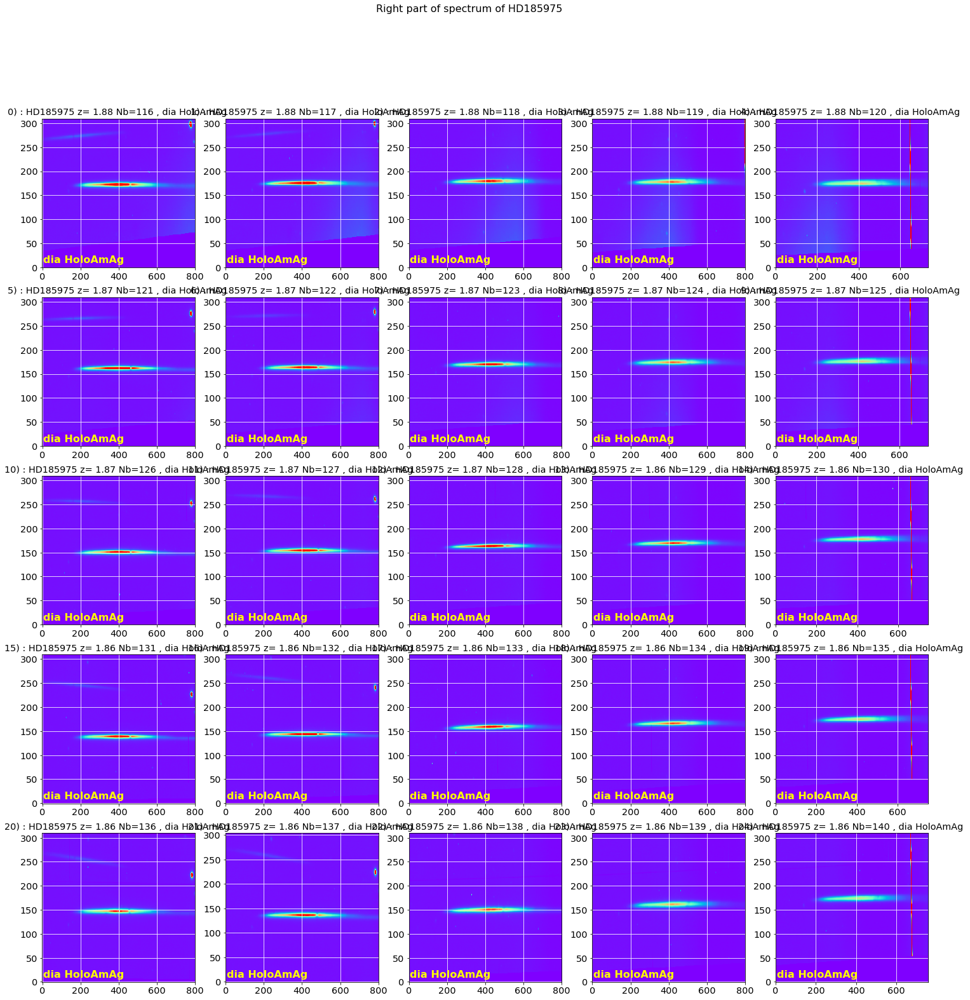

In [34]:
# Right spectrum
x_guess_right = []
for x in x_star :
    x_guess_right.append(min(IMSIZE-1,x+550))
ShowCenterImages(x_guess_right,y_star,[400]*len(all_images),[300]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

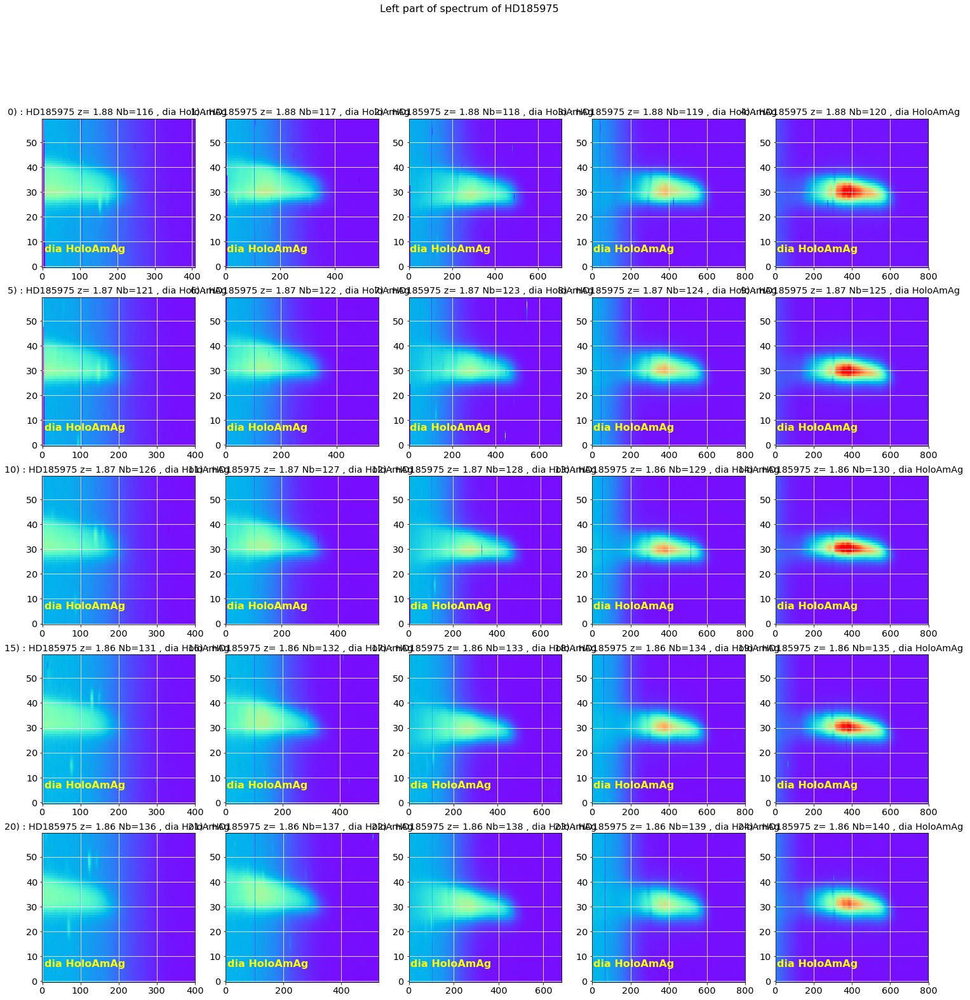

In [35]:
# Left spectrum
x_guess_left = []
for x in x_star :
    x_guess_left.append(max(1,x-550))
ShowCenterImages(x_guess_left,y_star,[400]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

### Extraction

[173,
 175,
 179,
 177,
 174,
 162,
 164,
 169,
 173,
 175,
 151,
 154,
 162,
 168,
 176,
 140,
 145,
 159,
 166,
 175,
 149,
 139,
 150,
 161,
 174]

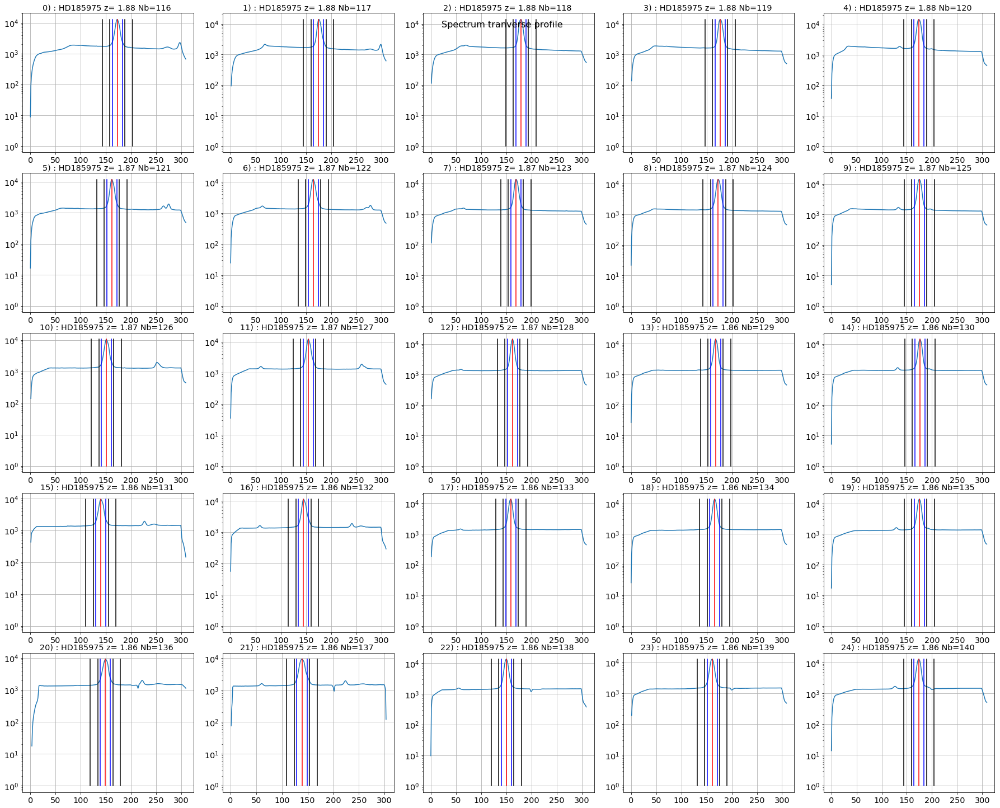

In [36]:
ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=5,DeltaX=2000,w=10,ws=[15,30],right_edge=1800)

X: 700
Model: CompoundModel737
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=54.292908410947426, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0     ...       c1_1              c2_1       
    ------------- ------------- ... ---------------- ------------------
    1.51843290881 59.3808919931 ... -0.0303926798879 -0.000111393440844


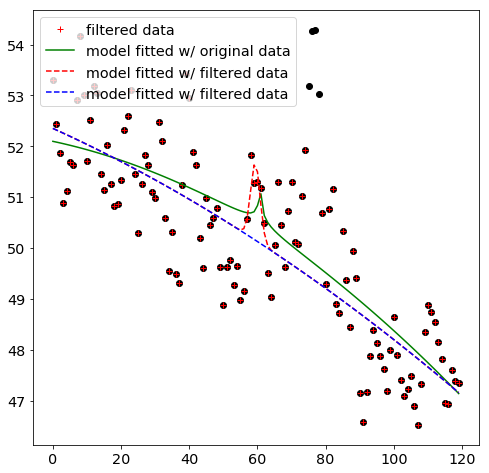

X: 720
Model: CompoundModel738
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=53.8075494973417, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
    amplitude_0     x_0_0        gamma_0    ...       c1_1              c2_1       
    ----------- ------------- ------------- ... ---------------- ------------------
            0.0 60.0581987054 4.98922721279 ... -0.0318310419766 -0.000141832281608


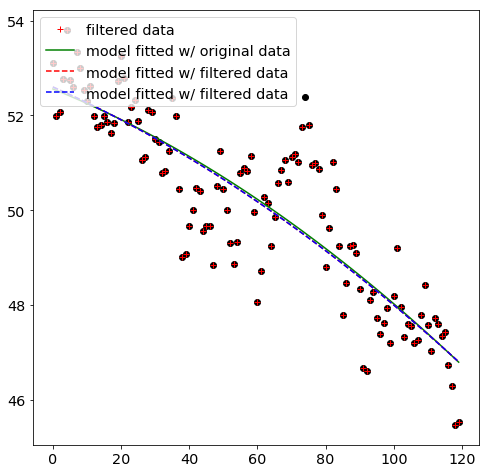

X: 740
Model: CompoundModel739
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=58.75841487520323, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0     ...       c1_1             c2_1      
    ------------- ------------- ... --------------- -----------------
    4.39673644995 69.4729365137 ... -0.061364530283 0.000177288021453


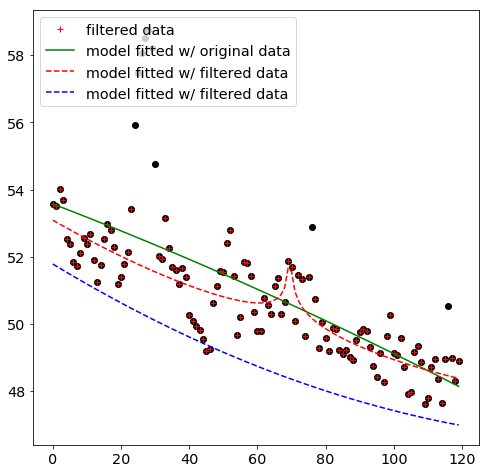

X: 760
Model: CompoundModel740
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=54.75049575017873, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
    amplitude_0     x_0_0        gamma_0    ...       c1_1              c2_1      
    ----------- ------------- ------------- ... ---------------- -----------------
            0.0 58.4554884246 4.98607691003 ... -0.0343448396313 -7.5322353219e-05


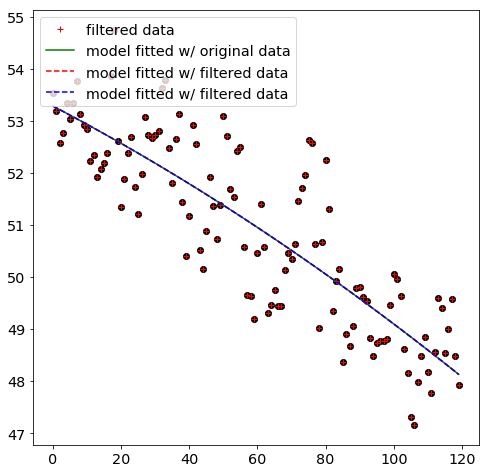

X: 780
Model: CompoundModel741
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=54.20634531627364, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
    amplitude_0     x_0_0        gamma_0    ...       c1_1              c2_1       
    ----------- ------------- ------------- ... ---------------- ------------------
            0.0 61.5350917715 3.88521508441 ... -0.0159050693257 -9.48827542819e-05


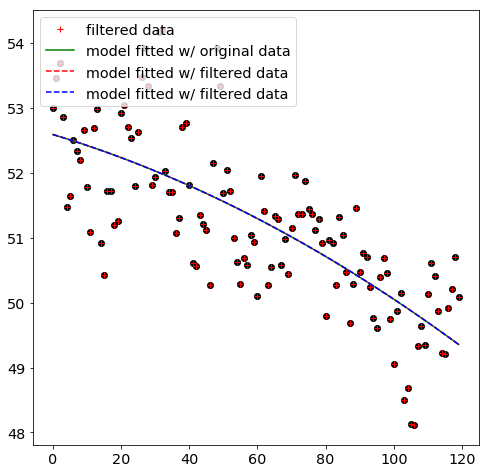

X: 800
Model: CompoundModel742
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=54.273830819372186, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...       c1_1              c2_1      
    ------------- ------------- ------------- ... ---------------- -----------------
    2.90830754015 58.5130410295 2.63258687625 ... -0.0568192356305 0.000297616745266


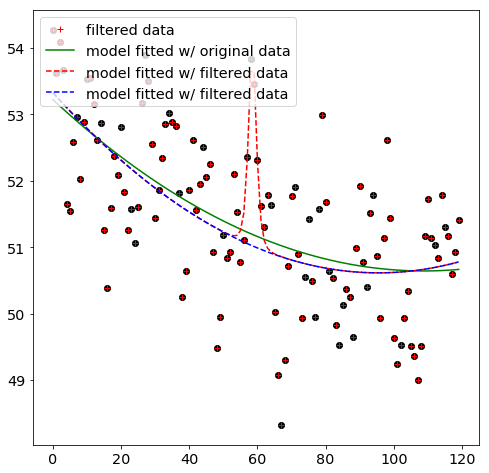

X: 820
Model: CompoundModel743
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=55.16333720133453, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
    amplitude_0     x_0_0        gamma_0    ...       c1_1             c2_1      
    ----------- ------------- ------------- ... ---------------- ----------------
            0.0 59.9233425991 5.05123709385 ... -0.0601412919658 0.00040187875589


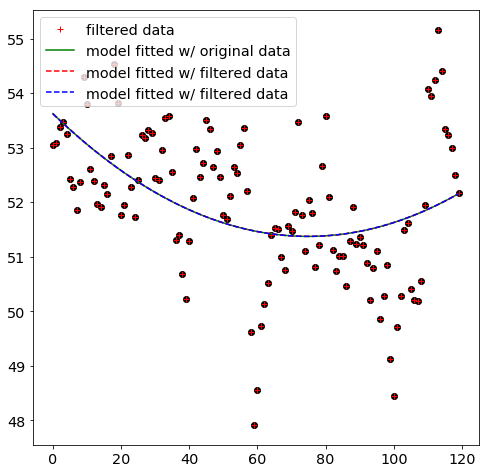

X: 840
Model: CompoundModel744
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=76.62028574642463, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...       c1_1              c2_1      
    ------------- ------------- ------------- ... ---------------- -----------------
    25.0242209139 44.3312057447 6.18868525755 ... -0.0523804775377 0.000278359714755


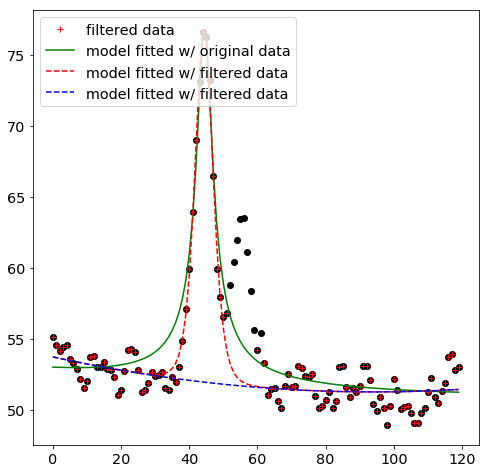

X: 860
Model: CompoundModel745
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=112.20575582494243, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...       c1_1              c2_1      
    ------------- ------------- ------------- ... ---------------- -----------------
    61.1313171274 55.6048343611 6.13742312829 ... -0.0270040450288 3.38756394513e-05


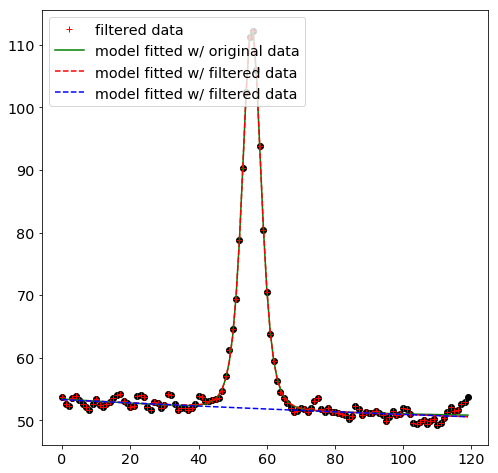

X: 880
Model: CompoundModel746
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=255.40427262595307, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...       c1_1             c2_1      
    ------------- ------------- ------------- ... ---------------- ----------------
    204.242113147 56.0807805159 6.51959896465 ... -0.0204602379146 6.8712484946e-06


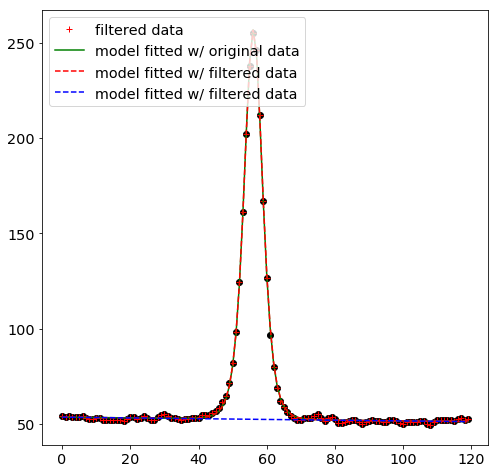

X: 900
Model: CompoundModel747
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=522.8709965082668, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...       c1_1             c2_1       
    ------------- ------------- ------------- ... --------------- ------------------
    477.577239179 56.4574249971 6.11185722138 ... 0.0262845805045 -0.000286022532684


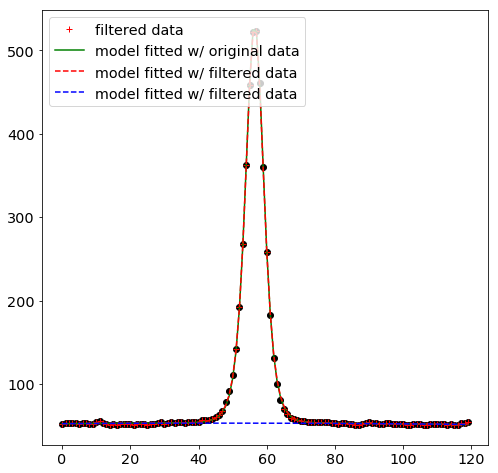

X: 920
Model: CompoundModel748
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=900.0082011100064, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...       c1_1             c2_1       
    ------------- ------------- ------------- ... --------------- ------------------
    849.190617198 56.7784091393 5.84149642079 ... 0.0472855190503 -0.000476621553733


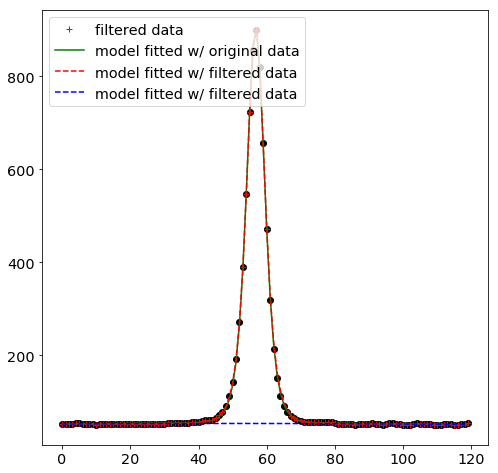

X: 940
Model: CompoundModel749
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1196.9289834134618, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1       
    ------------- ------------- ------------- ... -------------- ------------------
    1142.75762245 57.0215263063 5.93610599024 ... 0.078779751418 -0.000830158357701


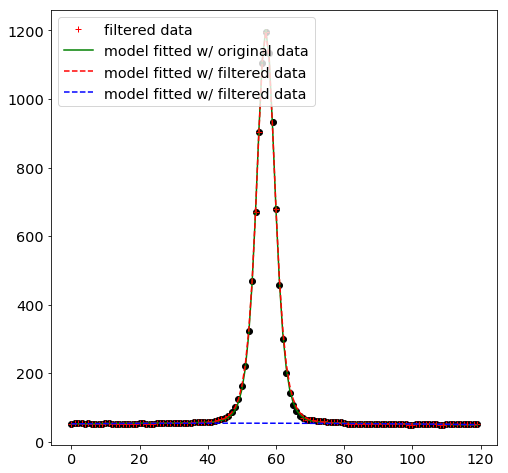

X: 960
Model: CompoundModel750
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1377.1728667434384, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1      
    ------------- ------------- ------------- ... -------------- -----------------
    1336.38580228 57.2467035505 6.28144895593 ... 0.105817092645 -0.00108270556297


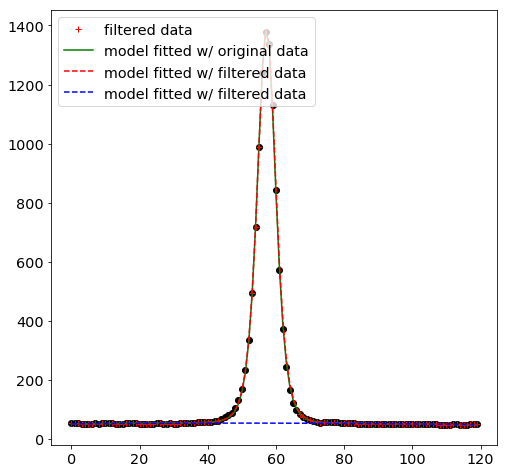

X: 980
Model: CompoundModel751
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1529.5612451455838, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1      
    ------------- ------------- ------------- ... -------------- -----------------
    1513.45641456 57.3229417515 5.68063245876 ... 0.115300743559 -0.00122684173857


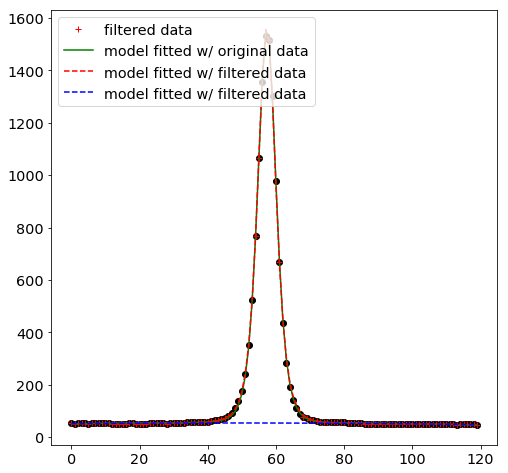

X: 1000
Model: CompoundModel752
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1614.5010877281443, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0     x_0_0       gamma_0    ...      c1_1             c2_1      
    ------------- ----------- ------------- ... -------------- -----------------
    1596.46351345 57.45460573 5.92046467221 ... 0.110723820742 -0.00116621400815


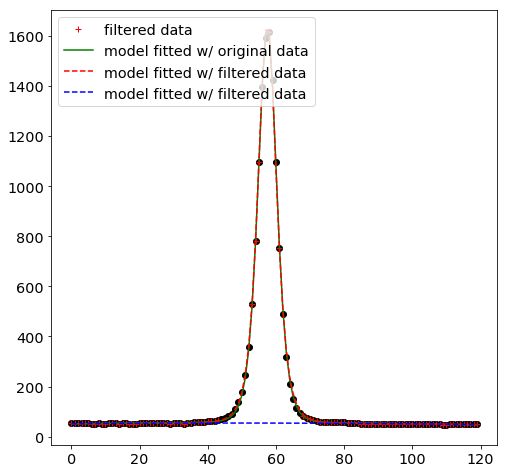

X: 1020
Model: CompoundModel753
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1837.483478304092, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0     ...        c1_1              c2_1       
    ------------- ------------- ... ----------------- ------------------
    1914.56416983 57.2442758813 ... -0.00922877459088 -0.000179328857791


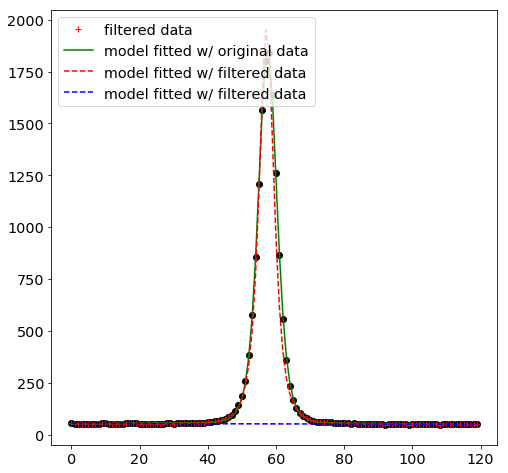

X: 1040
Model: CompoundModel754
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=2058.710507527214, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1      
    ------------- ------------- ------------- ... -------------- -----------------
    2027.37490507 57.5906164665 6.45238481441 ... 0.219269825079 -0.00221861679159


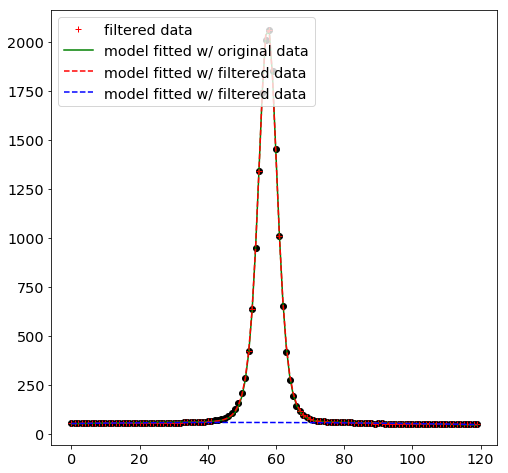

X: 1060
Model: CompoundModel755
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=2238.5245058100377, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1      
    ------------- ------------- ------------- ... -------------- -----------------
    2206.20511148 57.6153206255 6.55559103224 ... 0.262540188137 -0.00271099479804


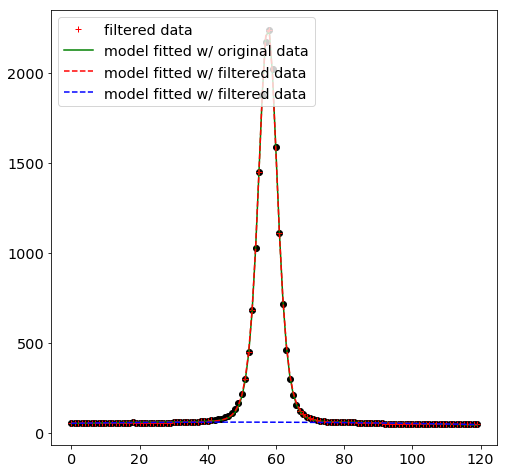

X: 1080
Model: CompoundModel756
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=2489.6333089737786, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
    amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1      
    ------------ ------------- ------------- ... -------------- -----------------
    2454.2249089 57.6508539153 6.62223980488 ... 0.292752980991 -0.00297692867488


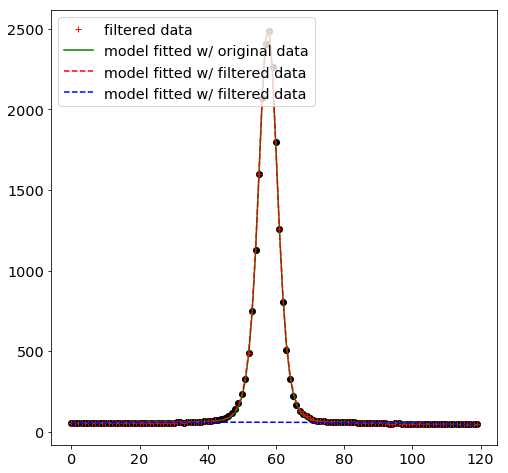

X: 1100
Model: CompoundModel757
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=2462.653100230614, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...      c1_1            c2_1      
    ------------- ------------- ------------- ... -------------- ----------------
    2424.34211407 57.6738568991 6.67202176112 ... 0.302681714586 -0.0030774152992


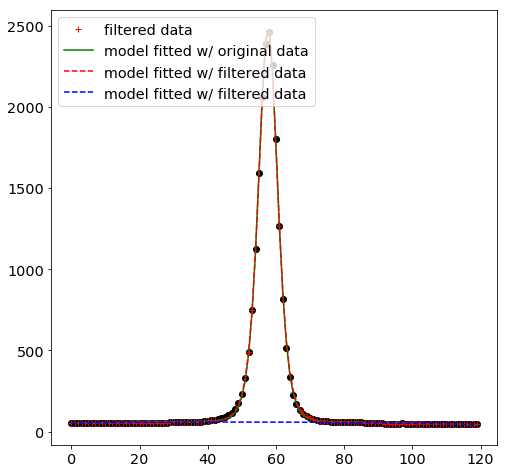

X: 1120
Model: CompoundModel758
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=2385.5292850212563, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1      
    ------------- ------------- ------------- ... -------------- -----------------
    2343.98433194 57.6566494811 6.98870504798 ... 0.343414662996 -0.00341188648117


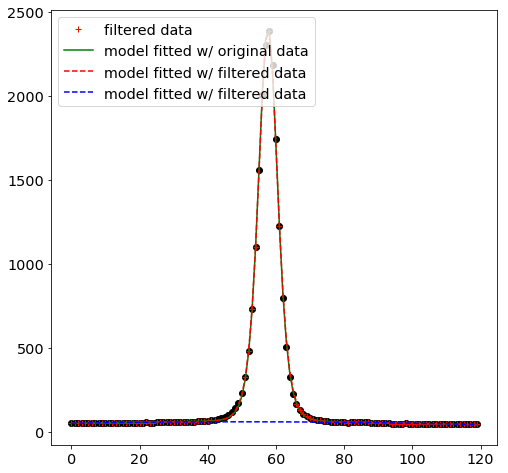

X: 1140
Model: CompoundModel759
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=2211.1420963959335, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
    amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1      
    ------------ ------------- ------------- ... -------------- -----------------
    2173.7730161 57.6175614069 7.53162524798 ... 0.299170511747 -0.00314755699168


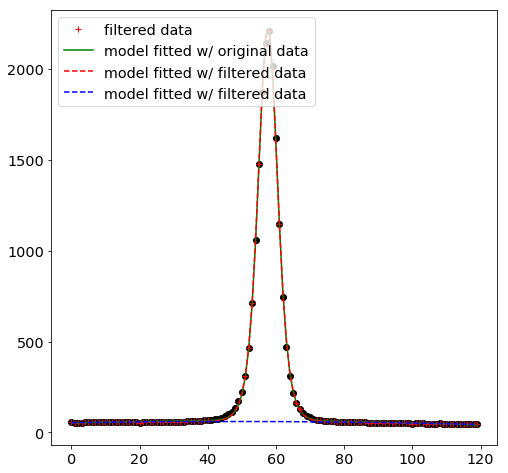

X: 1160
Model: CompoundModel760
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1690.214907042852, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0       gamma_0    ...      c1_1             c2_1      
    ------------- ------------- ------------ ... -------------- -----------------
    1648.97442646 57.6078983931 7.5460053887 ... 0.318471502983 -0.00340677958324


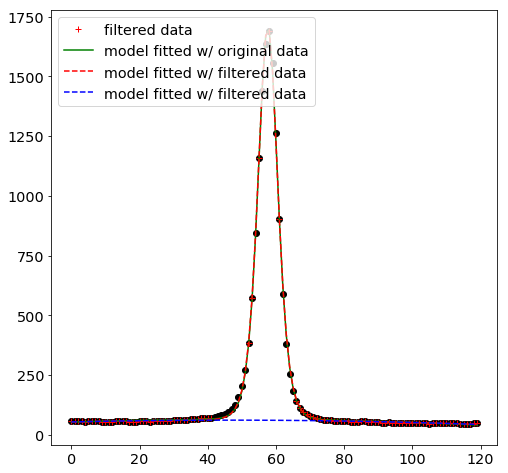

X: 1180
Model: CompoundModel761
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1759.007035302438, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1      
    ------------- ------------- ------------- ... -------------- -----------------
    1719.98292613 57.5719590288 7.06250053066 ... 0.273056608793 -0.00309400098053


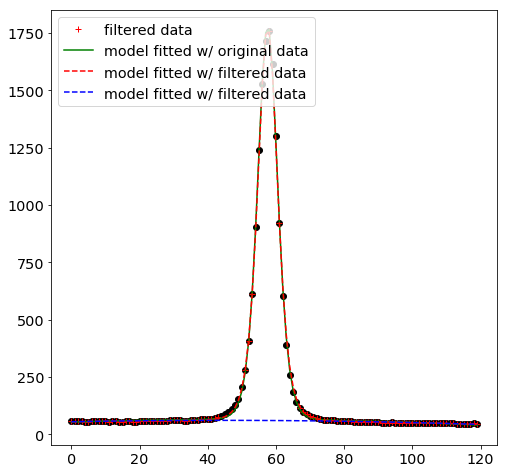

X: 1200
Model: CompoundModel762
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1471.4188762040762, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0     x_0_0        gamma_0    ...      c1_1            c2_1      
    ------------- ------------ ------------- ... -------------- ----------------
    1436.39068626 57.480818025 7.98933820147 ... 0.303107892578 -0.0034630632355


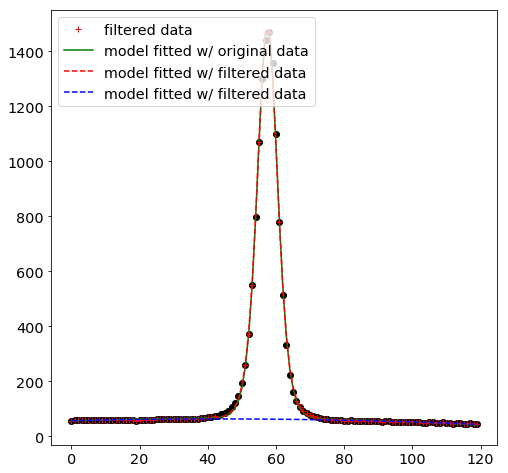

X: 1220
Model: CompoundModel763
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1229.8926235387112, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0        gamma_0    ...      c1_1             c2_1      
    ------------- ------------- ------------- ... -------------- -----------------
    1193.37968842 57.4012972345 8.11675254653 ... 0.274436647473 -0.00326926344594


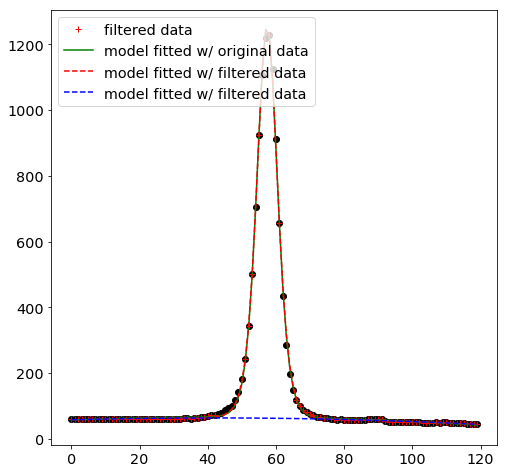

X: 1240
Model: CompoundModel764
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=1040.1497411013763, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
    amplitude_0    x_0_0        gamma_0    ...      c1_1             c2_1      
    ----------- ------------ ------------- ... -------------- -----------------
    1007.173361 57.318589046 7.48547221817 ... 0.192048317739 -0.00275204816787


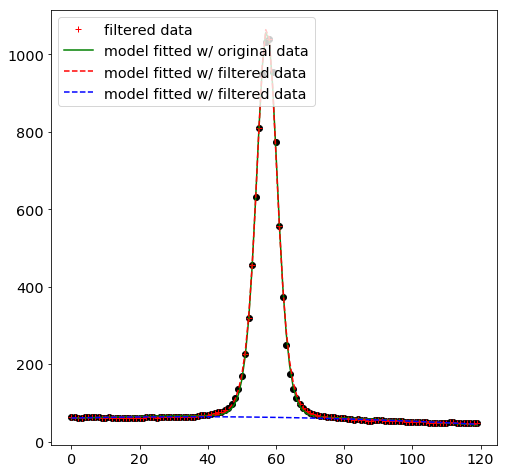

X: 1260
Model: CompoundModel765
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=888.3108608647619, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0      x_0_0       gamma_0    ...       c1_1             c2_1      
    ------------- ------------- ------------ ... --------------- -----------------
    819.098503281 56.7906951873 5.6960841225 ... 0.0463088896834 -0.00169928063212


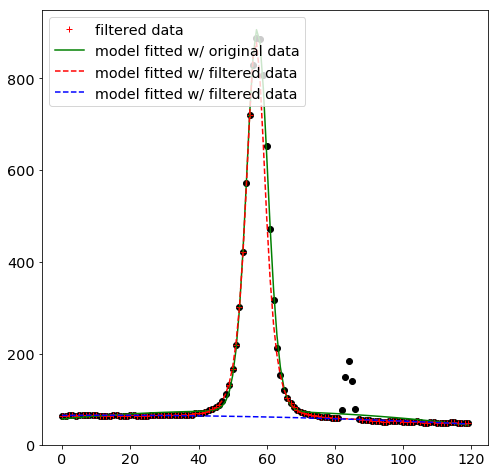

X: 1280
Model: CompoundModel766
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=700.0662318701454, x_0=60.0, gamma=5.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0     x_0_0        gamma_0    ...       c1_1             c2_1      
    ------------- ------------ ------------- ... --------------- -----------------
    662.907627797 56.992225259 7.21319021121 ... 0.0471930810794 -0.00181043573634


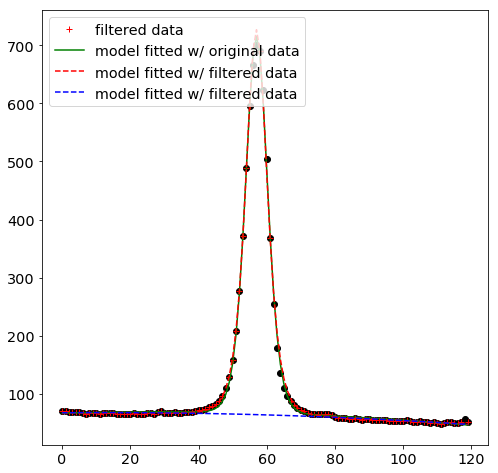

[ 37.71551941  17.47713549   8.27248454  33.23437173  15.24655219
   7.9299665   18.02174521  18.58936927  18.54776615  19.5331477
  18.41999296  17.70782877  17.98466776  18.90423042  17.2623834
  17.93411427  11.9345618   19.37333513  19.65682223  19.84909321
  19.99698772  20.86238505  22.35151532  22.42570794  21.12260512
  23.6627568   24.04423197  22.37309379  17.47000872  21.73661273]
[46.608158450505776, 0.95416922648784985, 0.092490429623369771, 0.29964487943267221, 0.66184491636367437, 2.9154873486396204, 0.88822941740072037, 3.0447032408704344, 2.779412386539907, 3.1735403965854103, 2.8926877267329076, 2.6628339521186941, 2.6830517699133019, 2.9553895210217345, 2.5771803473922907, 2.6895643984750088, 1.7908402346596446, 3.0649949389530571, 3.1318657350600101, 3.1514445575177001, 3.1548551114783305, 3.3776329978984778, 3.7708985117620726, 3.6681816576440101, 3.268440949580782, 3.9268378737902379, 3.9129405669713151, 3.3050900021353704, 2.300298868314393, 2.8978409318950025]
[

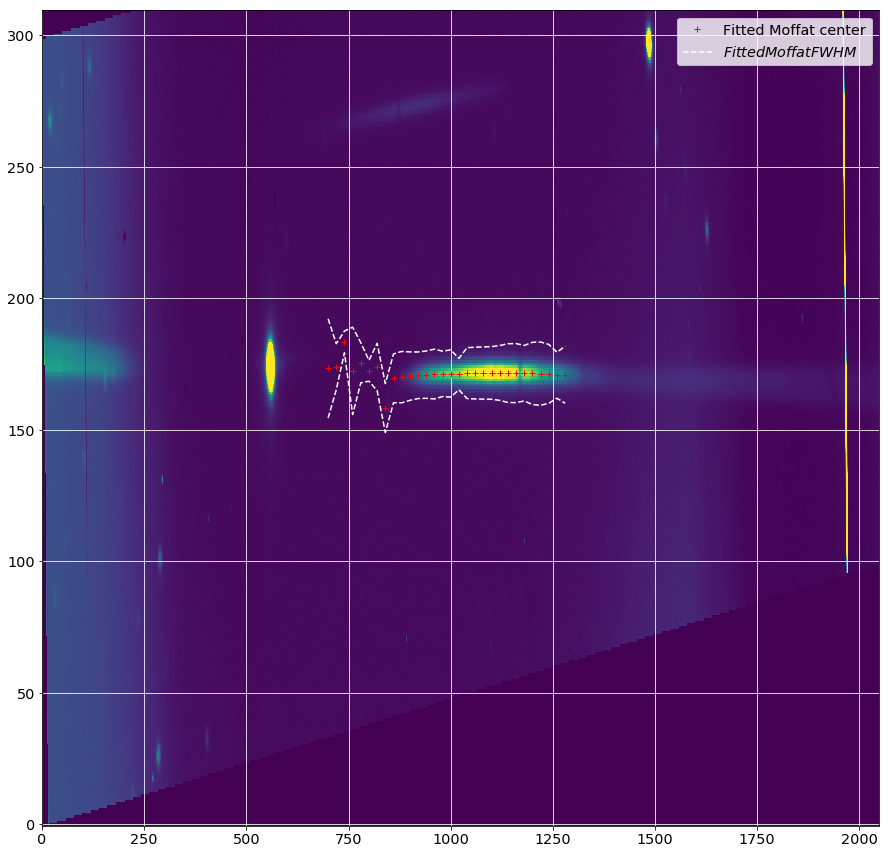

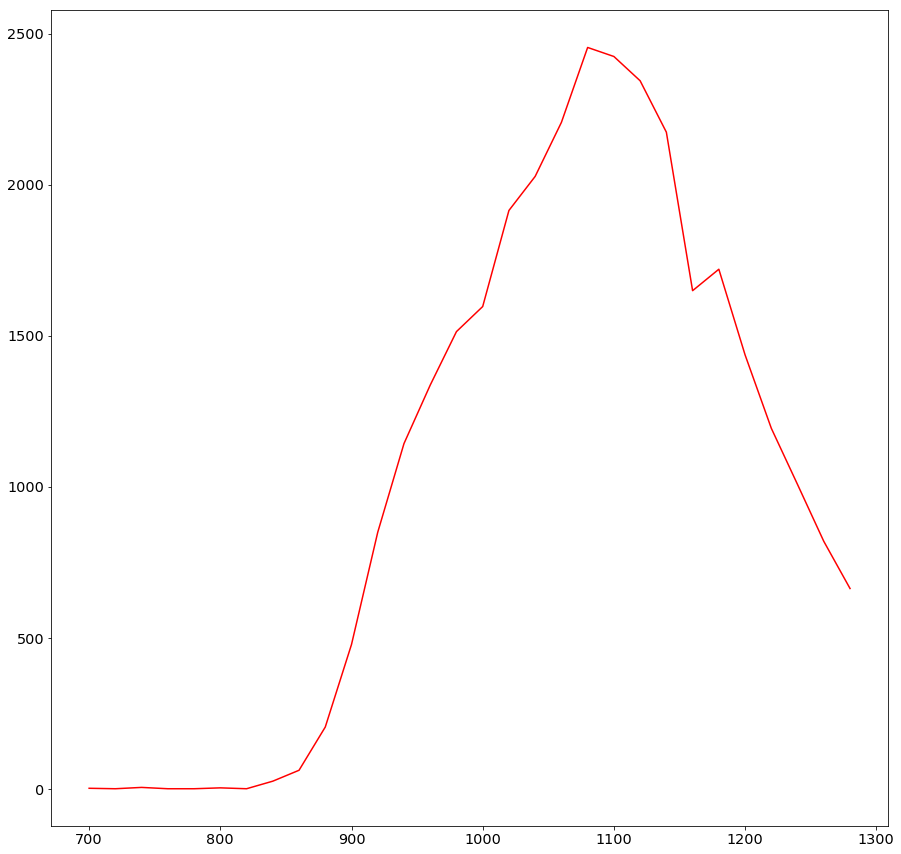

In [56]:
from astropy.stats import sigma_clip
from astropy.modeling import models, fitting


sel=0
xmin=700
xmax=1300
xwidth=20
ywidth=60
xs = []
y0s = []
gammas = []
alphas = []
amplitudes = []
y0 = int(y_star[sel])
ymax=all_images[sel].shape[0]
for x in range(xmin,xmax,xwidth):
    ystack = np.mean(all_images[sel][max(0,y0-ywidth):min(y0+ywidth,ymax),x:x+xwidth],axis=1)
    xstack = np.arange(ystack.size)
    
    #gg_init = models.Moffat1D(np.max(ystack), ywidth, 5) + models.Linear1D(0, np.median(ystack))
    gg_init = models.Moffat1D(np.max(ystack), ywidth, 5) + models.Polynomial1D(2)
    gg_init.amplitude_0.min = 0
    gg_init.amplitude_0.max = 2*np.max(ystack)
    gg_init.x_0_0.min = 0
    gg_init.x_0_0.max = ymax
    gg_init.gamma_0.min = 0
    gg_init.gamma_0.max = 2*ywidth
    gg_init.c0_1.min = 0
    gg_init.c0_1.max = 2*np.max(ystack)
    gg_init.c1_1 = 0
    gg_init.c2_1 = 0

    #fitter = fitting.SLSQPLSQFitter()
    #gg_fit = fitter(gg_init, xstack, ystack)
    or_fit = fitting.LevMarLSQFitter()
    fit = fitting.FittingWithOutlierRemoval(or_fit, sigma_clip, niter=3, sigma=3.0)
    # get fitted model and filtered data
    filtered_data, fitted_model = fit(gg_init, xstack, ystack)
    or_fitted_model = or_fit(gg_init, xstack, ystack)
    fitted_bkgd = models.Polynomial1D(2)
    fitted_bkgd.c0 = fitted_model[1].c0.value
    fitted_bkgd.c1 = fitted_model[1].c1.value
    fitted_bkgd.c2 = fitted_model[1].c2.value
    y0s.append(fitted_model[0].x_0.value)
    gammas.append(fitted_model[0].gamma.value)
    alphas.append(fitted_model[0].alpha.value)
    amplitudes.append(fitted_model[0].amplitude.value)
    xs.append(x)
    print 'X:',x
    print fitted_model

    fig = plt.figure(figsize=(8,8))
    plt.plot(xstack,ystack,'ko')
    plt.plot(xstack, filtered_data, 'r+', label="filtered data")
    plt.plot(xstack, or_fitted_model(xstack), 'g-',
         label="model fitted w/ original data")
    plt.plot(xstack, fitted_model(xstack), 'r--',
         label="model fitted w/ filtered data")
    #plt.plot(xstack, models.Linear1D(fitted_model[1].slope.value,fitted_model[1].intercept.value)(xstack), 'b--',
    #     label="model fitted w/ filtered data")
    plt.plot(xstack, fitted_bkgd(xstack), 'b--',
         label="model fitted w/ filtered data")
    plt.legend(loc=2, numpoints=1)

    #plt.plot(xstack,gg_fit(xstack))
    #plt.yscale('log')
    #plt.imshow(all_images[sel][max(0,y0-ywidth):min(y0+ywidth,ymax),x:x+xwidth])
    plt.show()
    
y0s = np.array(y0s)+y0-ywidth
fwhms = 2*np.array(gammas)*np.sqrt(2**(1./np.array(alphas))+1)
print fwhms
print alphas
print gammas
fig2 = plt.figure()
im = plt.imshow(all_images[sel],aspect='auto',origin='lowest',vmin=0,vmax=2000)
plt.plot(xs,y0s,'r+',label='Fitted Moffat center')
plt.plot(xs,y0s+0.5*fwhms,'w--',label="$Fitted Moffat FWHM$")
plt.plot(xs,y0s-0.5*fwhms,'w--')
plt.legend(loc='best')
plt.grid(color='white', ls='solid')
plt.show()

fig3 = plt.figure()
plt.plot(xs,amplitudes,'r-')
plt.show()

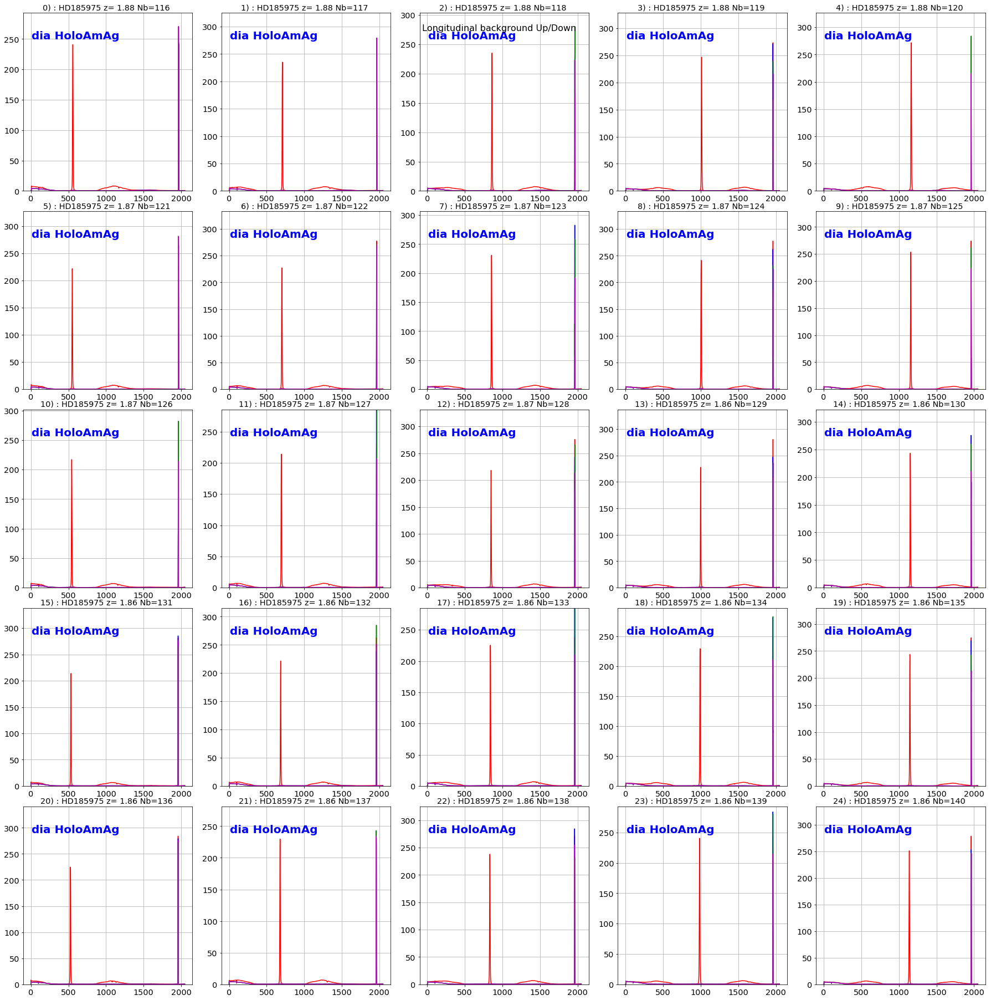

In [47]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(y_star,all_images,all_titles,object_name,all_expo,
                                                      w=10,ws=[15,30],right_edge=IMSIZE)

Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=5,right_edge=IMSIZE)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

(0, 100.0)

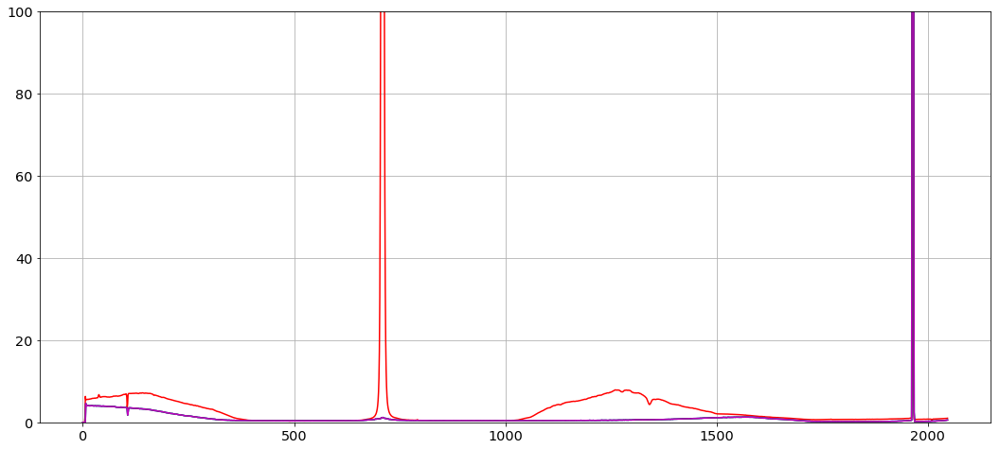

In [48]:
sel=1
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,100.)

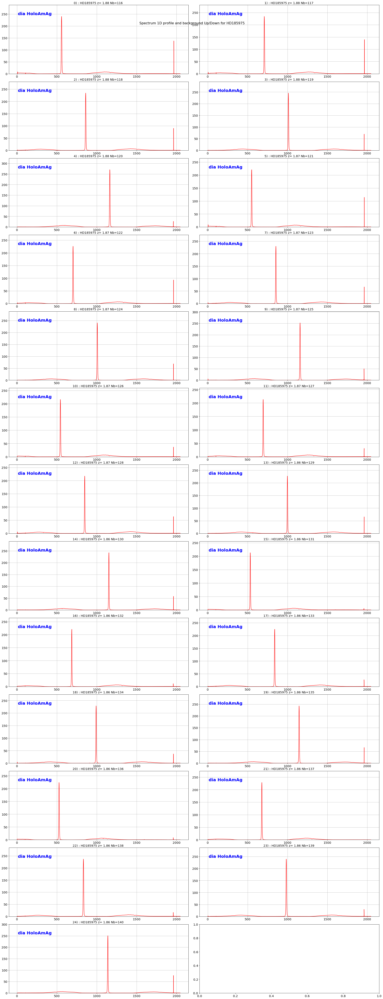

In [49]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=2)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

# Grating characterisation

dia HoloAmAg:	 gaussian center x=558.07+/-0.04
dia HoloAmAg:	 gaussian center x=709.44+/-0.05
dia HoloAmAg:	 gaussian center x=860.48+/-0.04
dia HoloAmAg:	 gaussian center x=1011.60+/-0.04
dia HoloAmAg:	 gaussian center x=1163.21+/-0.04
dia HoloAmAg:	 gaussian center x=550.73+/-0.04
dia HoloAmAg:	 gaussian center x=702.08+/-0.04
dia HoloAmAg:	 gaussian center x=854.58+/-0.04
dia HoloAmAg:	 gaussian center x=1006.13+/-0.04
dia HoloAmAg:	 gaussian center x=1157.93+/-0.04
dia HoloAmAg:	 gaussian center x=543.35+/-0.03
dia HoloAmAg:	 gaussian center x=695.31+/-0.04
dia HoloAmAg:	 gaussian center x=848.31+/-0.04
dia HoloAmAg:	 gaussian center x=999.37+/-0.03
dia HoloAmAg:	 gaussian center x=1151.37+/-0.04
dia HoloAmAg:	 gaussian center x=533.59+/-0.03
dia HoloAmAg:	 gaussian center x=685.90+/-0.03
dia HoloAmAg:	 gaussian center x=839.46+/-0.03
dia HoloAmAg:	 gaussian center x=991.59+/-0.03
dia HoloAmAg:	 gaussian center x=1146.07+/-0.04
dia HoloAmAg:	 gaussian center x=526.82+/-0.03
dia Hol

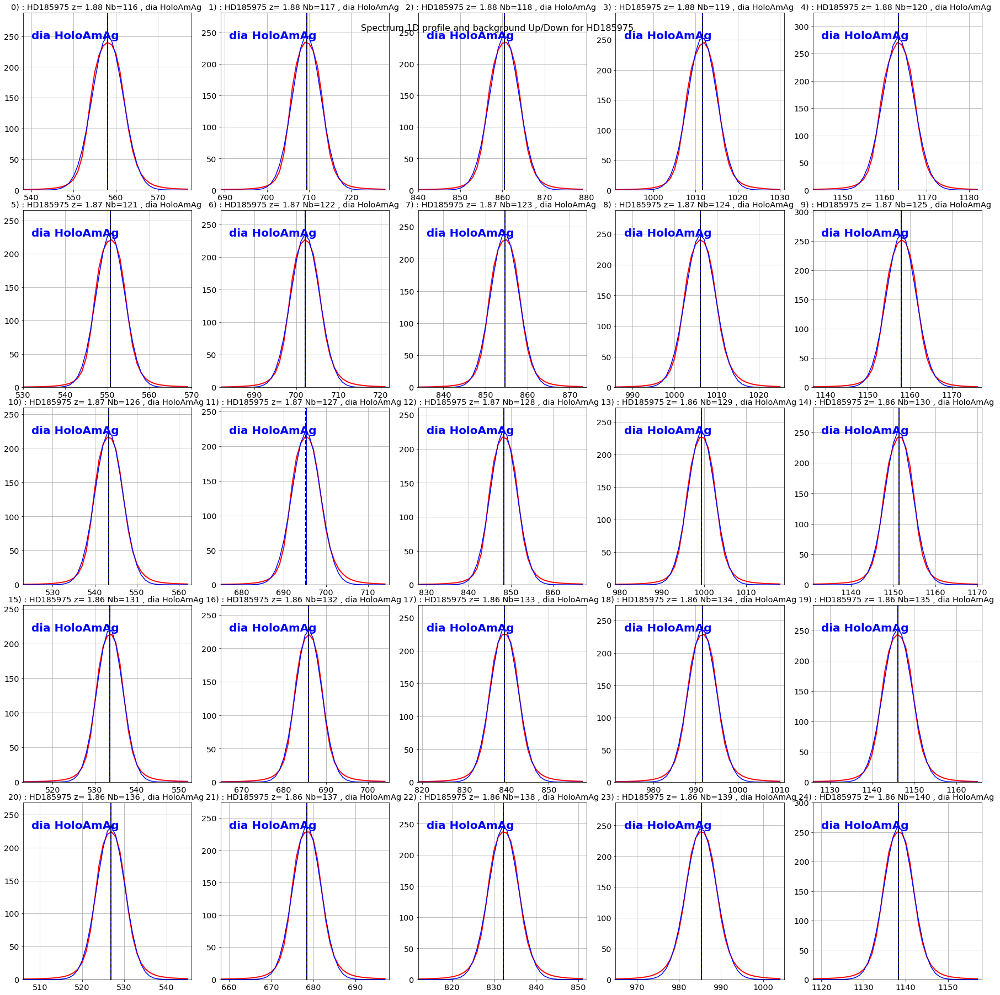

In [50]:
# Zero order profile
xlims_zero = []
for x in x_star :
    xlims_zero.append([x-20,x+20])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                       xlim=xlims_zero,guess=[10,800,100],vertical_lines=x_star)
print 'CCDPROC star centers:'
print x_star

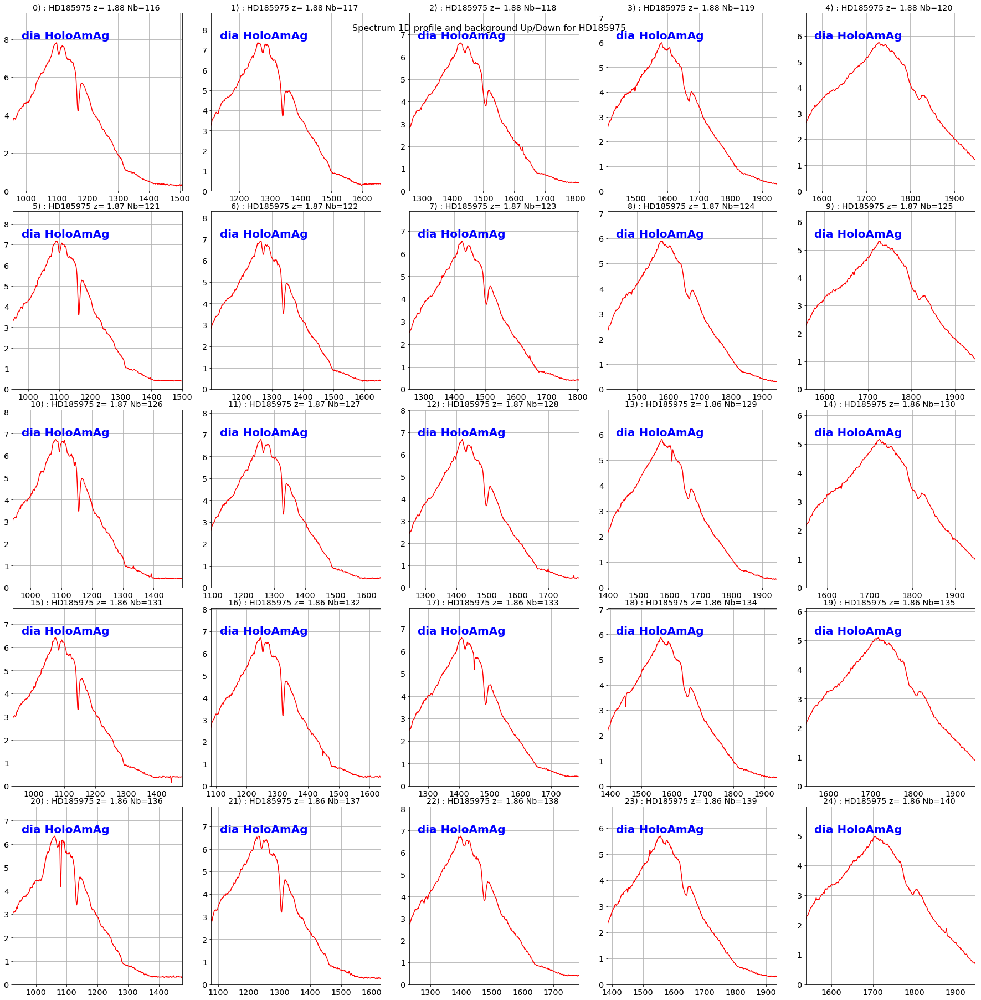

In [51]:
# Right spectrum profile
right_edge = thecorrspectra[0].shape[0]-100
xlims_right = []
for x in x_guess_right :
    if x == right_edge-1 :
        xlims_right.append([IMSIZE-2,IMSIZE-1])
    else :
        xlims_right.append([max(1,min(right_edge-2,int(x-150))),min(right_edge-1,int(x+400))])
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,xlim=xlims_right)

In [52]:
all_grat = []
for f in all_filt :
    all_grat.append(f.replace('dia ',''))

CALSPEC = Target("HD185975")
print '-------------------------------------'

Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_001.fits
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_002.fits
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_003.fits
-------------------------------------


Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -1.9 degrees
Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)
---------------------------------------------------
Wavelenght total shift: -8.04nm (after 6 steps)
	with D = 56.04 mm (DISTANCE2CCD = 55.45 +/- 0.19 mm, 3.1 sigma shift)
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -1.9 degrees
Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)

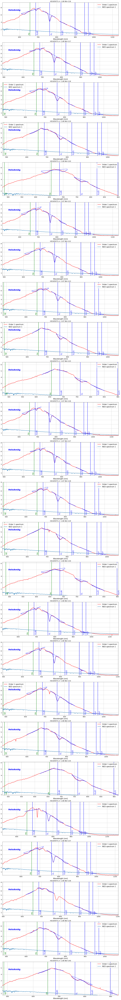

In [53]:
specs, Ds = CalibrateSpectra(thecorrspectra,0,x_star,order0_positions,all_titles,object_name,all_grat,
    xlim=xlims_right,target=CALSPEC,order=1,emission_spectrum=False,atmospheric_lines=True,hydrogen_only=True,
                 verbose=True,dir_top_images=dir_top_images) 

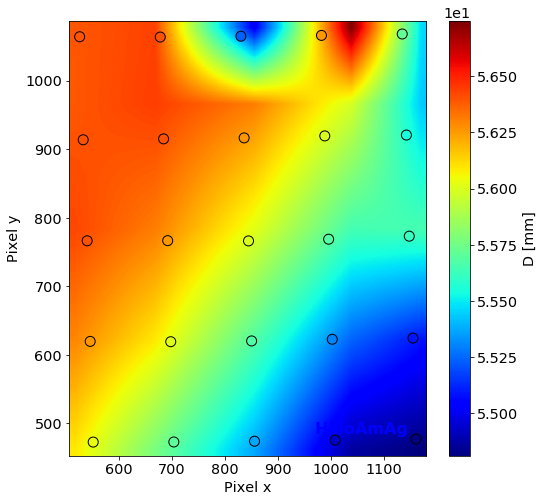

In [54]:
xx,yy, zz, interp = scatter_interpol(order0_positions,Ds,margin=10,kind='linear',
                                        plot=True,holo_name=holo_name,zlabel='D [mm]')

## Analyse angles to find hologram center

### with line crossing

In [ ]:
plot_dispersion_axis(order0_positions,all_theta,holo_name=holo_name)

In [ ]:
proj_x_lines, proj_y_lines = RotationLines(all_theta,order0_positions)
x_center, y_center, theta0 = FindHoloCenter(all_theta,order0_positions,proj_x_lines, proj_y_lines)

plot_rotation_lines(proj_x_lines,proj_y_lines,holo_name=holo_name,center=[x_center, y_center, theta0])

### with surface analysis

In [ ]:
theta_xx,theta_yy,theta_z,theta_interp = scatter_interpol(order0_positions,all_theta,margin=10,kind='cubic',
                                        plot=True,holo_name=holo_name,zlabel='Rotation angle $\\theta$')

In [ ]:
margin = 30

surface_gradient(theta_xx,theta_yy,theta_z,margin=margin,plot=True,holo_name=holo_name,dir_top_images=dir_top_images)

x_center, y_center, theta_tilt = saddle_point(theta_xx,theta_yy,theta_z,theta_interp,margin=margin,plot=True,verbose=True,
                                holo_name=holo_name,vmin=-0.000025,vmax=0.000025,dir_top_images=dir_top_images) 

In [ ]:
Image(filename='../../common_tools/pictures/hologram_centers.jpg')

In [ ]:
from holo_specs import *
print '-----------------------------'
H = Hologram(holo_name)
print '-----------------------------'
print 'Use imported N() function to compute order0 and order1 positions:'
xs, line1, line2 = neutral_lines(x_center,y_center,theta_tilt)
order0_position, order1_position, AB = find_order01_positions([x_center,y_center],H.N,theta_interp)

fig=plt.figure(figsize=(10,10))
# Background hologram shape
plt.imshow(H.hologram_shape,origin='lower', alpha=0.5, cmap=cm.pink)
# Pointings with rotation angle
x, y = np.array(order0_positions).T
plt.scatter(x, y, c=all_theta, label='Pointings',s=100, cmap=cm.jet, marker='o',vmin=np.min(all_theta), vmax=np.max(all_theta),edgecolors='k')
im = plt.imshow(theta_z, alpha=0.7,extent=[np.min(theta_xx)-margin, np.max(theta_xx)+margin, np.min(theta_yy)-margin, np.max(theta_yy)+margin],origin='lower',aspect='auto',cmap=cm.jet)
# Hologram resolution
Ns = []
for i in range(len(x)):
    Ns.append(H.N([x[i],y[i]]))
N_xx,N_yy,N_z,N_interp = scatter_interpol(order0_positions,Ns,margin=10,kind='cubic',plot=False)
CS = plt.contour(N_xx,N_yy,N_z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=14,fontweight='bold',fmt='%d')
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
# Hologram geometry
plt.plot(xs,line1,'b-',label='Symmetric axes',lw=2)
plt.plot(xs,line2,'b-',lw=2)
plt.scatter(order0_position[0],order0_position[1],s=200,facecolor='red',label='Order 0 position')
plt.scatter(order1_position[0],order1_position[1],s=200,facecolor='black',label='Order +1 position')
plt.errorbar(0.5*IMSIZE+PLATE_CENTER_SHIFT_X/PIXEL2MM,0.5*IMSIZE+PLATE_CENTER_SHIFT_Y/PIXEL2MM,xerr=PLATE_CENTER_SHIFT_X_ERR/PIXEL2MM,yerr=PLATE_CENTER_SHIFT_Y_ERR/PIXEL2MM,marker='+',color='red',label='Plate center')
# Axis and colobar settings
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.95),xytext=(0.05,0.95),fontsize=24,verticalalignment='top',
                  fontweight='bold',color='blue',horizontalalignment='left',xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])
plt.gca().set_aspect('equal', adjustable='box')
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Rotation angle $\\theta$ [$\^\circ$]') #,fontsize=16)
plt.legend()
figfilename=os.path.join(dir_top_images,'%s_geometry.pdf' % holo_name)
plt.savefig(figfilename, bbox_inches='tight', rasterized=True, dpi=300)  
plt.show()

## Extract FWHM profiles

Ajuster les paramètres ici pour supprimes les lignes blanches, étoiles proches, etc... et les propager dans la fonction FWHMProfiles

In [ ]:
index=0
x_0=int(x_star[index])
y_0=int(y_star[index])
xtest = 1300
width_to_stack = 10
central_star_cut = 100
width_cut = 20
edge_cut = 1900
full_image=np.copy(all_images[index])
image=full_image[y_0-width_cut:y_0+width_cut,0:edge_cut]/all_expo[index]
image[:,x_0-central_star_cut:x_0+central_star_cut]=0 ## TURN OFF CENTRAL STAR
profile = np.median(image.T[xtest:xtest+width_to_stack],axis=0)
print 'FWHM =',fwhm(range(image.shape[0]),profile)
fig=plt.figure(figsize=(20,6))
plt.imshow(image.T[xtest:xtest+width_to_stack],origin='lower',cmap='rainbow',vmin=0,vmax=10)
plt.plot(range(image.shape[0]),profile,'b-',lw=3)
plt.plot(range(image.shape[0]),image.T[xtest],'r--',lw=3)
plt.show()

In [ ]:
theprofiles = FWHMProfiles(all_images,x_star,y_star,all_expo,all_titles,object_name,all_filt,
        width_to_stack=10,central_star_cut = 100, width_cut = 20, left_edges = None, right_edges = None, max_fwhm=20)

In [ ]:
f, axarr = plt.subplots(5,1,figsize=(25,30))
for i in range(5):
    for j in range(5):
        profile = theprofiles[5*i + j %5]
        axarr[i].plot(profile[0],profile[1])
        axarr[i].set_xlabel('Pixel x')
        axarr[i].set_ylabel('FWHM line %d' % i)
        axarr[i].set_ylim([0,15])
plt.show()

In [ ]:
# Don't plot profiles with FWHM>5 in the right part
threshold_loose = 6
threshold_high = 5
right_part = 1200
right_edge = 1800
f, axarr = plt.subplots(5,1,figsize=(25,30))
selected_centers_loose = []
selected_centers_high = []
for i in range(5):
    for j in range(5):
        profile = theprofiles[5*i + j %5]
        skip = True
        high = False
        for k,f in enumerate(profile[1]) :
            if f < threshold_loose and profile[0][k]>right_part and profile[0][k]<right_edge : 
                skip = False
                if f < threshold_high : high = True
        axarr[i].set_xlabel('Pixel x',fontsize=24)
        axarr[i].set_ylabel('FWHM line %d' % i,fontsize=24)
        axarr[i].set_ylim([0,15])
        if skip : continue
        axarr[i].plot(profile[0],profile[1])
        axarr[i].plot([0,right_edge],[threshold_loose,threshold_loose],'k--')
        axarr[i].plot([0,right_edge],[threshold_high,threshold_high],'k-')
        selected_centers_loose.append(order0_positions[5*i+j%5])
        if high : selected_centers_high.append(order0_positions[5*i+j%5])
selected_centers_loose=np.array(selected_centers_loose)
selected_centers_high=np.array(selected_centers_high)
plt.show()

In [ ]:
print selected_centers_high
plt.figure(figsize=(6,6))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o',label='star centroids',markersize=5)
plt.plot(selected_centers_loose.T[0],selected_centers_loose.T[1],'mo',label='order +1 spectra with FWHM<%.1f' % threshold_loose,markersize=10)
plt.plot(selected_centers_high.T[0],selected_centers_high.T[1],'ro',label='order +1 spectra with FWHM<%.1f' % threshold_high,markersize=15)
plt.plot(1090,653,'gx',markersize=20,label='rotation center with Hessian')
plt.xlim(0,2048)
plt.ylim(0,2048)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.text(1300,1250,holo_name,fontsize=18)
plt.legend()
plt.grid(True)

In [ ]:
min_fwhms = []
for i in range(5):
    for j in range(5):
        profile = theprofiles[5*i + j %5]
        min_fwhm = 1e20
        for k,f in enumerate(profile[1]) :
            if profile[0][k]>right_part and profile[0][k]<right_edge : 
                if min_fwhm > profile[1][k] :
                    min_fwhm = profile[1][k]
        min_fwhms.append(min_fwhm)

margin = 10
positions = (order0_positions.T[:2]).T
x, y = positions.T
xx,yy,z,interp = scatter_interpol(positions,min_fwhms,margin=margin)

fig = plt.figure(figsize=(8,8))
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k')
plt.clabel(CS, inline=1, fontsize=10)
plt.show()

In [ ]:
from holo_specs import *
print '-----------------------------'
H = Hologram(holo_name)
print '-----------------------------'
print 'Use imported N() function to compute order0 and order1 positions:'
xs, line1, line2 = neutral_lines(x_center,y_center,theta_tilt)
order0_position, order1_position, AB = find_order01_positions([x_center,y_center],H.N,theta_interp)

fig=plt.figure(figsize=(10,10))
# Background hologram shape
plt.imshow(H.hologram_shape,origin='lower', alpha=0.5, cmap=cm.pink)
# Pointings with rotation angle
x, y = np.array(order0_positions).T
plt.scatter(x, y, c=all_theta, label='Pointings',s=100, cmap=cm.jet, marker='o',vmin=np.min(all_theta), vmax=np.max(all_theta),edgecolors='k')
im = plt.imshow(theta_z, alpha=0.7,extent=[np.min(theta_xx)-margin, np.max(theta_xx)+margin, np.min(theta_yy)-margin, np.max(theta_yy)+margin],origin='lower',aspect='auto',cmap=cm.jet)
# Hologram resolution
CS = plt.contour(xx,yy,z,10,linewidths=1,colors='k',label='Minimum spectrum FWHM value')
plt.clabel(CS, inline=1, fontsize=10)
labels = ['FWHM']
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
# Hologram geometry
plt.plot(xs,line1,'b-',label='Symmetric axes',lw=2)
plt.plot(xs,line2,'b-',lw=2)
plt.scatter(order0_position[0],order0_position[1],s=200,facecolor='red',label='Order 0 position')
plt.scatter(order1_position[0],order1_position[1],s=200,facecolor='black',label='Order +1 position')
plt.errorbar(0.5*IMSIZE+PLATE_CENTER_SHIFT_X/PIXEL2MM,0.5*IMSIZE+PLATE_CENTER_SHIFT_Y/PIXEL2MM,xerr=PLATE_CENTER_SHIFT_X_ERR/PIXEL2MM,yerr=PLATE_CENTER_SHIFT_Y_ERR/PIXEL2MM,marker='+',color='red',label='Plate center')
# Axis and colobar settings
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.95),xytext=(0.05,0.95),fontsize=24,verticalalignment='top',
                  fontweight='bold',color='blue',horizontalalignment='left',xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])
plt.gca().set_aspect('equal', adjustable='box')
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Rotation angle $\\theta$ [$\^\circ$]') #,fontsize=16)
plt.legend()
figfilename=os.path.join(dir_top_images,'%s_geometry.pdf' % holo_name)
plt.savefig(figfilename, bbox_inches='tight', rasterized=True, dpi=300)  
plt.show()

## Save grating FWHMs

In [ ]:
dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
print 'Save results in ',dirname
print '--------------------------------------------------------------'
#textfilename=os.path.join(dirname,'hologram_rotation_angles.txt')
#print textfilename
#out = []
#for index in range(len(all_theta)):
#    out.append([order0_positions[index][0], order0_positions[index][1], all_theta[index]])
#np.savetxt(textfilename,np.array(out),header="x_star y_star theta_in_degree",fmt='%.3f')

textfilename=os.path.join(dirname,'hologram_min_fwhm.txt')
print textfilename
out = []
for index in range(len(all_theta)):
    out.append([order0_positions[index][0], order0_positions[index][1], min_fwhms[index]])
np.savetxt(textfilename,np.array(out),header="x_star y_star min_fwhm",fmt='%.3f')

#text = "#x_center y_center theta_tilt_in_degree\n" 
#text += "%.3f %.3f %.3f\n" % (x_center, y_center, theta_tilt)
#textfilename = dirname+"/hologram_center.txt"
#print textfilename
#f=open(textfilename,'w')
#f.write(text)
#f.close()

## Save spectra

In [ ]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=thecorrspectra[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,clobber=True)
    
!ls -l spectrum_fitsspec